In [2]:
import xarray as xr
import numpy as np
from matplotlib import pyplot as plt

from skimage.metrics import structural_similarity as ssim
from sklearn.metrics import make_scorer, check_scoring, mean_squared_error
from sklearn.metrics import r2_score
from sklearn import metrics
from sklearn.metrics import make_scorer, check_scoring, mean_squared_error


In [3]:
path_output= "/home/b/b381362/output/pca_allinput"  

mlp_path_pred_target = path_output + "/MLP_outputs_target_pred_testing_T09_fold1_pcaall.nc"
rf_path_pred_target = path_output + "/RF_outputs_target_pred_testing_T09_fold1_pcaall.nc"


In [4]:
rf_ds_out = xr.open_dataset(rf_path_pred_target)
mlp_ds_out = xr.open_dataset(mlp_path_pred_target)

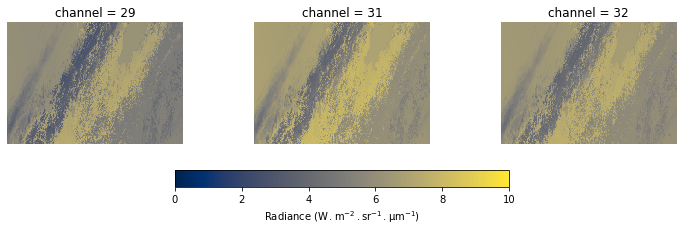

In [126]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid
import numpy as np

name ='target'

# name ='prediction'
# ds_out = rf_ds_out.sel(lat=slice(53.09, 54.47) )

ds_out = mlp_ds_out.sel(lat=slice(53.09, 54.47) )


f, axes = plt.subplots(1, 3, figsize=(6*2, 3*1.066)) #width of 15 inches and 7 inches in height.
f.subplots_adjust(wspace=0.4, hspace=0.4)

axli = axes.ravel()
    
axli[0] = plt.subplot(131)
i = 28
result_ssim =  ssim(ds_out['target'][i].values.flatten(), ds_out['prediction'][i].values.flatten())
result_rmse =  np.sqrt(metrics.mean_squared_error(ds_out['target'][i].values.flatten(), ds_out['prediction'][i].values.flatten()))
result_score = r2_score(ds_out['target'][i].values.flatten(), ds_out['prediction'][i].values.flatten())
# plt.title( "ssim: {:.3f}, mse: {:.3f}, score: {:.3f}  ".format(result_ssim, result_rmse, result_score))
ds_out[name][i].plot(cmap='cividis', vmin=0, vmax=10, add_colorbar=False) #vmin=vmin, vmax=vmax)  #, cmap='jet')
# axli[0].set_title( "ssim: {:.3f}, rmse: {:.3f}, score: {:.3f}  \n channel = {}".format(result_ssim, result_rmse, result_score, int(ds_out.prediction.channel[i])))#f'month = {i}')
axli[0].set_axis_off()


axli[1] = plt.subplot(132)
i = 30
vmin = np.min([(rf_ds_out['prediction'][i]), (rf_ds_out['target'][i]), (mlp_ds_out['prediction'][i])])  
vmax = np.max([(rf_ds_out['prediction'][i]), (rf_ds_out['target'][i]), (mlp_ds_out['prediction'][i])]) 
ds_out[name][i].plot(cmap='cividis', vmin=0, vmax=10,add_colorbar=False) #, vmin=vmin, vmax=vmax)  #, cmap='jet')
axli[1] .set_axis_off()

axli[2] = plt.subplot(133)
i = 31
vmin = np.min([(rf_ds_out['prediction'][i]), (rf_ds_out['target'][i]), (mlp_ds_out['prediction'][i])])  
vmax = np.max([(rf_ds_out['prediction'][i]), (rf_ds_out['target'][i]), (mlp_ds_out['prediction'][i])]) 
im = ds_out[name][i].plot(cmap='cividis', vmin=0, vmax=10,add_colorbar=False) #, vmin=vmin, vmax=vmax)  #, cmap='jet')
axli[2].set_axis_off()



f.colorbar(im, location = 'bottom', ax=axli.tolist(), label = r'Radiance $(\mathrm{W\,.m^{-2}\,.sr^{-1}\,.µm^{-1}})$', shrink=0.5)




f.savefig('target', dpi= 250) 

plt.show()
plt.close() 

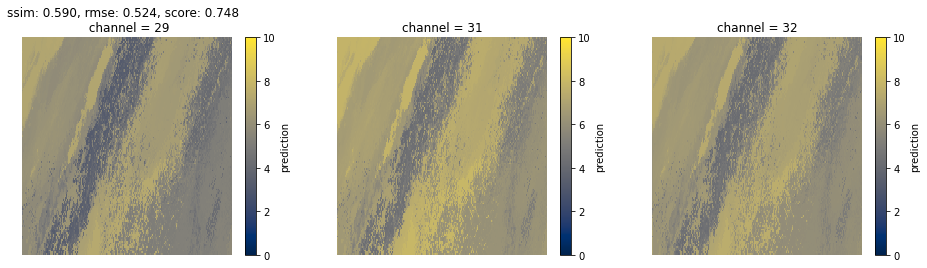

In [22]:
# name ='target'

name ='prediction'


# ds_out= mlp_ds_out
# ds_out= rf_ds_out
ds_out = rf_ds_out.sel(lat=slice(53.09, 54.47) )
# ds_out = rf_ds_out.sel(lat=slice(47.5, 53.09))


fig = plt.figure(figsize=(16, 4))

axes0 = plt.subplot(131)

i = 28
result_ssim =  ssim(ds_out['target'][i].values.flatten(), ds_out['prediction'][i].values.flatten())
result_rmse =  np.sqrt(metrics.mean_squared_error(ds_out['target'][i].values.flatten(), ds_out['prediction'][i].values.flatten()))
result_score = r2_score(ds_out['target'][i].values.flatten(), ds_out['prediction'][i].values.flatten())

# plt.title( "ssim: {:.3f}, mse: {:.3f}, score: {:.3f}  ".format(result_ssim, result_rmse, result_score))


vmin = np.min([(rf_ds_out['prediction'][i]), (rf_ds_out['target'][i]), (mlp_ds_out['prediction'][i])] )  
vmax = np.max([(rf_ds_out['prediction'][i]), (rf_ds_out['target'][i]), (mlp_ds_out['prediction'][i])]) 
ds_out[name][i].plot(cmap='cividis', vmin=0, vmax=10) #vmin=vmin, vmax=vmax)  #, cmap='jet')

axes0.set_title( "ssim: {:.3f}, rmse: {:.3f}, score: {:.3f}  \n channel = {}".format(result_ssim, result_rmse, result_score, int(ds_out.prediction.channel[i])))#f'month = {i}')
axes0.set_axis_off()


axes1 = plt.subplot(132)
i = 30
vmin = np.min([(rf_ds_out['prediction'][i]), (rf_ds_out['target'][i]), (mlp_ds_out['prediction'][i])])  
vmax = np.max([(rf_ds_out['prediction'][i]), (rf_ds_out['target'][i]), (mlp_ds_out['prediction'][i])]) 
ds_out[name][i].plot(cmap='cividis', vmin=0, vmax=10) #, vmin=vmin, vmax=vmax)  #, cmap='jet')
axes1.set_axis_off()

axes2 = plt.subplot(133)
i = 31
vmin = np.min([(rf_ds_out['prediction'][i]), (rf_ds_out['target'][i]), (mlp_ds_out['prediction'][i])])  
vmax = np.max([(rf_ds_out['prediction'][i]), (rf_ds_out['target'][i]), (mlp_ds_out['prediction'][i])]) 
ds_out[name][i].plot(cmap='cividis', vmin=0, vmax=10) #, vmin=vmin, vmax=vmax)  #, cmap='jet')
im =axes2.set_axis_off()



In [26]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

cbar_kwargs = {'orientation':'horizontal', 'shrink':0.6, 'aspect':40, 'label':'Percent Deviation'}
fg = ds_out.sel(channel=slice(31, 32)).plot(col='channel',
                         col_wrap=3,
                         cmap='RdBu_r', vmin=0, vmax=10,  # <-- New bit.
                         cbar_kwargs=cbar_kwargs,
                         robust=False                        )


ValueError: Dataset.plot cannot be called directly. Use an explicit plot method, e.g. ds.plot.scatter(...)

ssim: 0.590, mse: 0.524, score: 0.748  


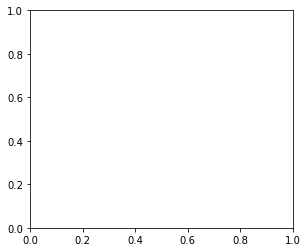

In [17]:
ds_out = rf_ds_out.sel(lat=slice(53.09, 54.47) )
# ds_out = rf_ds_out.sel(lat=slice(47.5, 53.09))


fig = plt.figure(figsize=(16, 4))

plt.subplot(131)
i = 28
result_ssim =  ssim(ds_out['target'][i].values.flatten(), ds_out['prediction'][i].values.flatten())
result_rmse =  np.sqrt(metrics.mean_squared_error(ds_out['target'][i].values.flatten(), ds_out['prediction'][i].values.flatten()))
result_score = r2_score(ds_out['target'][i].values.flatten(), ds_out['prediction'][i].values.flatten())

# plt.title( "ssim: {:.3f}, mse: {:.3f}, score: {:.3f}  ".format(result_ssim, result_rmse, result_score))
print("ssim: {:.3f}, mse: {:.3f}, score: {:.3f}  ".format(result_ssim, result_rmse, result_score))



-825.1811036156026


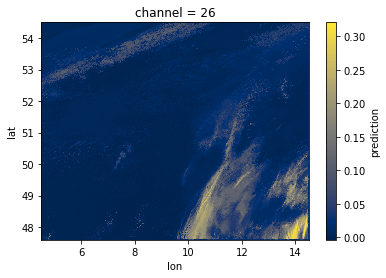

In [5]:
i = 25
result_ssim =  ssim(ds_out['target'][i], ds_out['prediction'][i])
result_score = r2_score(ds_out['target'][i], ds_out['prediction'][i])

vmin = np.min([(ds_out['prediction'][i]), (ds_out['target'][i])])  
vmax = np.max([(ds_out['prediction'][i]), (ds_out['target'][i])]) 

ds_out['prediction'][i].plot(cmap='cividis', vmin=vmin, vmax=vmax) #, vmin=0, vmax=0.12, cmap='jet')# cmap='cividis', 
print(result_score)

In [6]:
print(" ============== MSE ============ ")
for i  in range(36):
    result =  np.sqrt(metrics.mean_squared_error(ds_out['target'][i].values.flatten(), ds_out['prediction'][i].values.flatten()))
    print(i+1, "flatten:" ,result)
    
    result = np.sqrt(metrics.mean_squared_error(ds_out['target'][i], ds_out['prediction'][i]))
    print(i+1, "no flatten",result)


 ============== MSE ============ 
1 flatten: 0.03491347024108798
1 no flatten 0.03491347024108798
2 flatten: 0.06877368535127547
2 no flatten 0.06877368535127547
3 flatten: 0.02979663647871752
3 no flatten 0.02979663647871752
4 flatten: 0.03155467887006563
4 no flatten 0.03155467887006563
5 flatten: 0.060316569356521375
5 no flatten 0.06031656935652138
6 flatten: 0.04291238855442419
6 no flatten 0.04291238855442418
7 flatten: 0.028428458941847343
7 no flatten 0.02842845894184734
8 flatten: 0.026267219059269153
8 no flatten 0.026267219059269153
9 flatten: 0.028352028362375298
9 no flatten 0.028352028362375298
10 flatten: 0.03090851960629886
10 no flatten 0.030908519606298857
11 flatten: 0.03127232827273265
11 no flatten 0.031272328272732644
12 flatten: 0.03149432731935734
12 no flatten 0.03149432731935734
13 flatten: 0.03669899617674451
13 no flatten 0.03669899617674451
14 flatten: 0.03728905127690386
14 no flatten 0.037289051276903865
15 flatten: 0.05892529519899307
15 no flatten 0.058

In [7]:
#slide
#### slides

# ds_out= xr.open_dataset(mlp_path_pred_target)
ds_out= mlp_ds_out

# ds_out= /rf_ds_out
    
print(" ============== RMSE ============ ")
for i  in range(36):
    result =  np.sqrt(metrics.mean_squared_error(ds_out['target'][i].values.flatten(), ds_out['prediction'][i].values.flatten()))
    print(i+1, "flatten:" ,result)
    # print(result)

print( "no flatten")
for i  in range(36):    
    result = np.sqrt(metrics.mean_squared_error(ds_out['target'][i], ds_out['prediction'][i]))
    print(i+1, "no flatten",result)
    # print(result)



 ============== RMSE ============ 
1 flatten: 0.02087538420273118
2 flatten: 0.08195865042436612
3 flatten: 0.01658167927627182
4 flatten: 0.018733793408848315
5 flatten: 0.07023174204988156
6 flatten: 0.043178684310847905
7 flatten: 0.024530218322251385
8 flatten: 0.015500421730522093
9 flatten: 0.01601188856467601
10 flatten: 0.017151375536113934
11 flatten: 0.018020589504739143
12 flatten: 0.018585133500045477
13 flatten: 0.02217665437780778
14 flatten: 0.022503174188445992
15 flatten: 0.0685057346142331
16 flatten: 0.08408009872978121
17 flatten: 0.06357807603249042
18 flatten: 0.029714646477336227
19 flatten: 0.040559548254227466
20 flatten: 0.047057375489850964
21 flatten: 0.049716735115238955
22 flatten: 0.04918993589630423
23 flatten: 0.0472761576301128
24 flatten: 0.0035182797527179366
25 flatten: 0.01870116132788536
26 flatten: 0.00803703301899103
27 flatten: 0.03859368877745522
28 flatten: 0.06442823381440985
29 flatten: 0.2688950290234334
30 flatten: 0.13721179500456807
31 

In [8]:
#### slides
from sklearn.metrics import make_scorer, check_scoring, mean_squared_error

ds_out= xr.open_dataset(mlp_path_pred_target)

# ds_out= rf_ds_out
    
print(" ============== SSIM ============ ")
for i  in range(36):
    result_score = ssim(ds_out['target'][i].values.flatten(), ds_out['prediction'][i].values.flatten())
    # print(i+1, "flatten:" ,result_score)
    print(result_score)
 
print( "no flatten")
for i  in range(36): 
    result_score = ssim(ds_out['target'][i], ds_out['prediction'][i])
    # print(i+1, "no flatten",result_score)
    print(result_score)


 ============== SSIM ============ 
0.9849217641174499
0.9198818712347112
0.9913916929048883
0.9885739686414962
0.927129187921968
0.9320992547386643
0.9588571039428441
0.9913267417640041
0.991635179280532
0.9909612423052212
0.9898212460036032
0.9888567936292699
0.9832231595638391
0.9827912551127866
0.9313400513302053
0.9182420028320214
0.9301311772808578
0.9486621931770741
0.942036391716161
0.941743162397148
0.9139740212376725
0.9140755816620433
0.9325377340446332
0.9989827032369005
0.9880584471273547
0.9720902839271757
0.965972659400714
0.9576877592582393
0.8625040631172041
0.8998814878571118
0.8686590306815412
0.8772717553759297
0.9519996577509792
0.9747618164324361
0.9848361559654621
0.9951009529327107
no flatten
0.9866217554967798
0.9175787318864708
0.9922133945847398
0.9896184843440353
0.9255110776353496
0.9344240807340527
0.959112641730545
0.9919354079754646
0.9923398154819963
0.9918957654388117
0.9907744889376362
0.9898746604082992
0.9853026804692774
0.9850157572021089
0.93079151

In [92]:
#### slides
from sklearn.metrics import make_scorer, check_scoring, mean_squared_error

# ds_out= xr.open_dataset(mlp_path_pred_target)

ds_out= rf_ds_out

print(" ============== score ============ ")

for i  in range(36):
    result_score = r2_score(ds_out['target'][i].values.flatten(), ds_out['prediction'][i].values.flatten())
    # print(i+1, "flatten:" ,result_score)
    print(result_score)


print( "no flatten")
for i  in range(36):
    result_score = r2_score(ds_out['target'][i], ds_out['prediction'][i])
    # print(i+1, "no flatten",result_score)
    print(result_score)



 ============== score ============ 
0.9800948603184684
0.8885539861703876
0.9791114356736556
0.9799082657265714
0.8980477686833117
0.9279485086062118
0.9139945383664666
0.9758891755949392
0.9781707012364385
0.9796401743626043
0.9800794709320708
0.9799260431242883
0.9799871483692739
0.9799777045009951
0.9220958105141048
0.8864636083705248
0.8985480595330216
0.9173118599971316
0.9111052607387055
0.8554980503227891
0.8446374078550555
0.8424898893915853
0.8658217741962141
0.8968143490891349
0.9169147059375035
0.9120787865536929
0.8515849381400673
0.917088891321567
0.9376079536652007
0.9406807940172907
0.9383512576275461
0.9378503361828414
0.9394128287517456
0.9337814041268988
0.9328483876540125
0.8883981937019989
no flatten
-2.352927457934665
0.8108505686699258
-1.5611534017174276
-1.4419687451315144
0.8234385687907693
0.8465854472943465
0.7933812519838396
-0.4601592691338097
-1.2420050465419739
-1.7476154630381502
-2.481743552313509
-1.609458445313284
-2.0789858924988818
-1.91922334523663

In [17]:
#### slides

from sklearn.metrics import make_scorer, check_scoring, mean_squared_error

# ds_out= xr.open_dataset(mlp_path_pred_target)

# ds_out= rf_ds_out
ds_out= mlp_ds_out

 
print(" ============== score ============ ")

pca_list_f =[]
pca_list =[]
Screenshot from 2022-09-13 17-18-07
for i  in range(6):
    result_score = r2_score(ds_out['pca_target'][i].values.flatten(), ds_out['pca_prediction'][i].values.flatten())
    # print(i+1, "flatten:" ,result_score)
    print(result_score)

    pca_list_f.append(result_score)

print( "no flatten")
for i  in range(6):
 
    result_score = r2_score(ds_out['pca_target'][i], ds_out['pca_prediction'][i])
    # print(i+1, "no flatten",result_score)
    print(result_score)

    pca_list.append(result_score)
np.mean(pca_list_f), np.mean(pca_list)

 ============== score ============ 
0.995533359871919
0.9058636000484876
0.7915968962852615
0.6547933400976825
0.5760562653395611
0.07258671130104077
no flatten
0.9871058435655385
0.8402804378757537
0.7932034208393552
0.5921577248185137
0.5945275313520303
0.07774331404514319


(0.6660716954906588, 0.6475030454160559)

In [14]:
for i  in range(6):
    result_score = r2_score(ds_out['pca_target'][i].values, ds_out['pca_prediction'][i].values)
    # print(i+1, "flatten:" ,result_score)
    print(result_score)

    pca_list_f.append(result_score)

0.9871058435655385
0.8402804378757537
0.7932034208393552
0.5921577248185137
0.5945275313520303
0.07774331404514319


In [9]:
#### slides

from sklearn.metrics import make_scorer, check_scoring, mean_squared_error

ds_out= mlp_ds_out

# ds_out= rf_ds_out

 
print(" ============== rmse PCA============ ")

pca_list_f =[]
pca_list =[]

for i  in range(6):
    result_score =  np.sqrt(metrics.mean_squared_error(ds_out['pca_target'][i].values.flatten(), ds_out['pca_prediction'][i].values.flatten()))
 
    # print(i+1, "flatten:" ,result_score)
    print(result_score)

    pca_list_f.append(result_score)

print( "no flatten")
for i  in range(6):
 
    result_score = np.sqrt(metrics.mean_squared_error(ds_out['pca_target'][i], ds_out['pca_prediction'][i]))
    print(i+1, "no flatten",result_score)
    # print(result_score)

    pca_list.append(result_score)


 ============== rmse PCA============ 
0.33116668769588137
0.9351509116320996
0.4625486529567703
0.48322623591968994
0.53349821940825
0.5133532689651652
no flatten
1 no flatten 0.3311666876958813
2 no flatten 0.9351509116320996
3 no flatten 0.4625486529567703
4 no flatten 0.48322623591968994
5 no flatten 0.53349821940825
6 no flatten 0.5133532689651652


In [10]:
np.mean(pca_list_f), np.mean(pca_list)

(0.5431573294296428, 0.5431573294296428)

In [12]:
result_score =  np.sqrt(metrics.mean_squared_error(ds_out['pca_target'].values.flatten(), ds_out['pca_prediction'].values.flatten()))
print(result_score)

0.5744257107273951


In [89]:
#### slides

from sklearn.metrics import make_scorer, check_scoring, mean_squared_error

ds_out= xr.open_dataset(mlp_path_pred_target)

# ds_out= rf_ds_out

 
print(" ============== ssim ============ ")

pca_list_f =[]
pca_list =[]

for i  in range(6):
    result_score = ssim(ds_out['pca_target'][i].values.flatten(), ds_out['pca_prediction'][i].values.flatten())
    # print(i+1, "flatten:" ,result_score)
    print(result_score)

    pca_list_f.append(result_score)

print( "no flatten")
for i  in range(6):
 
    result_score = ssim(ds_out['pca_target'][i], ds_out['pca_prediction'][i])
    print(i+1, "no flatten",result_score)
    # print(result_score)

    pca_list.append(result_score)


 ============== ssim ============ 
0.8524313600170947
0.6878195535655031
0.7200685166508161
0.5139226872326331
0.6270661620556094
0.45800920656572064
no flatten
1 no flatten 0.9245117013868152
2 no flatten 0.7635968205601337
3 no flatten 0.7765712043455824
4 no flatten 0.5291954678270432
5 no flatten 0.6522899054980238
6 no flatten 0.478994294108714


In [82]:
np.mean(pca_list_f), np.mean(pca_list)

(0.6660716954906588, 0.6475030454160559)

In [45]:
from numpy import linalg as LA
i =6
LA.norm(ds_out['target'][i].values.flatten()-ds_out['prediction'][i].values.flatten())/LA.norm(ds_out['target'][i].values.flatten())



0.1360273967876437

<xarray.DataArray 'prediction' ()>
array(-0.01080406)
Coordinates:
    channel  int64 26 <xarray.DataArray 'prediction' ()>
array(0.34917895)
Coordinates:
    channel  int64 26


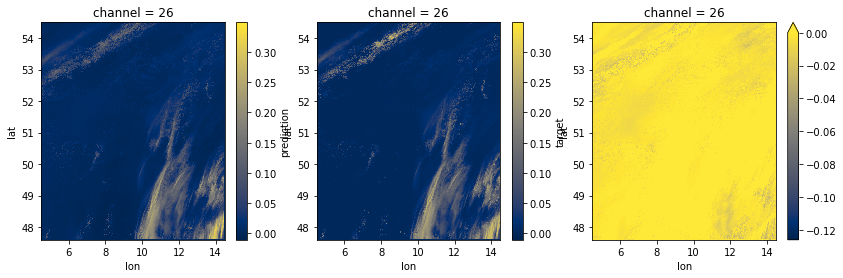

In [31]:
n =25 
fig = plt.figure(figsize=(14, 4))

print(ds_out['prediction'][n].min(), ds_out['prediction'][n].max())
plt.subplot(131)
ds_out['prediction'][n].plot(vmin=ds_out['prediction'][n].min(), vmax= ds_out['prediction'][n].max(), cmap='cividis') 
plt.subplot(132)
ds_out['target'][n].plot(vmin= ds_out['prediction'][n].min(), vmax= ds_out['prediction'][n].max(), cmap='cividis')
plt.subplot(133)
(ds_out['target'][n]-ds_out['prediction'][n]).plot(vmax= 0.0, cmap='cividis') 


 ================ number of channels 6
score componente 1: 0.7446212790024156
score componente 2: 0.8507274947706001
score componente 3: 0.7838368953013167
score componente 4: 0.5003737759771882
score componente 5: 0.5840349858537021
score componente 6: 0.20900826821825336


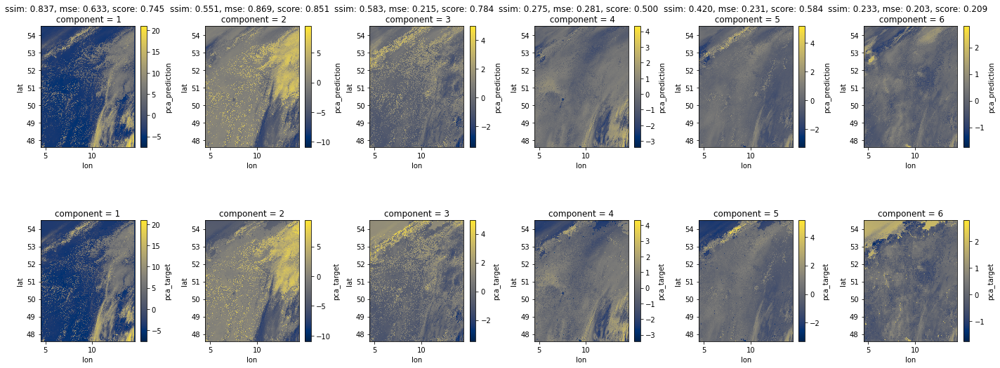

In [5]:

def pca_target_pca_prediction_3D(rf_ds_out,mlp_ds_out , path_output, name_plot, plot_type):

    n_img = np.shape(rf_ds_out['pca_target'])[0]
    print(" ================ number of channels", n_img)
    # n_channels
    # f, axes = plt.subplots(2, n_img, figsize=(4*2, 1*4*1.066)) #width of 15 inches and 7 inches in height.
    f = plt.figure(figsize=(4 * n_img, 4*1.0333*  2) ,facecolor = 'white')  #WxH
    f.subplots_adjust(wspace=0.4, hspace=0.6)

    # axli = axes.ravel()
    position =list(range(1,n_img*2+1)) #[1:76]
    position_pred = position[:n_img] # position[1::2]
    position_pca_target = position[n_img:] #position[::2] #  


    for i in range(n_img):
    #         plt.suptitle("ssim: " + str(ssim(ds_out['pca_target'][i]
    # , ds_out['pca_prediction'][i]
    # )) + " rmse: " + str(mean_squared_error(ds_out['pca_target'][i]
    # , ds_out['pca_prediction'][i]
    # )))
        result_ssim =  ssim(rf_ds_out['pca_target'][i], rf_ds_out['pca_prediction'][i])
        result_mse =  mean_squared_error(rf_ds_out['pca_target'][i], rf_ds_out['pca_prediction'][i])
        result_score = r2_score(rf_ds_out['pca_target'][i], rf_ds_out['pca_prediction'][i])

        # plt.figtext(0.5,0.5, "ssim: {:.3f}, rmse: {:.3f}".format(result_ssim, result_rmse), ha="center", va="top", fontsize=14)
        # vmin = np.min([np.min(ds_out['pca_prediction'][i]), np.min(ds_out['pca_target'][i])])  
        # vmax = np.max([np.max(ds_out['pca_prediction'][i]), np.max(ds_out['pca_target'][i])]) 
        vmin = np.min([(rf_ds_out['pca_prediction'][i]), (rf_ds_out['pca_target'][i]), (mlp_ds_out['pca_prediction'][i])])  
        vmax = np.max([(rf_ds_out['pca_prediction'][i]), (rf_ds_out['pca_target'][i]), (mlp_ds_out['pca_prediction'][i])]) 


        # plt.subplots_adjust(hspace = 0.3 )

        axes0 = plt.subplot(2, n_img, position_pred[i]) ##2,m_img, +n_img)
        mlp_ds_out['pca_prediction'][i].plot(ax = axes0, cmap='cividis', vmin=vmin, vmax=vmax) #, vmin=0, vmax=0.12, cmap='jet')# cmap='cividis', 

        # axes0.text(6.1, 1.36, "ssim: {:.3f}, rmse: {:.3f}".format(result_ssim, result_rmse), color='b',fontsize=18)

        if plot_type == "spectral":
            axes0.set_title( "ssim: {:.3f}, mse: {:.3f}, score: {:.3f}  \n channel = {}".format(result_ssim, result_mse, result_score, int(rf_ds_out.pca_prediction.channel[i])))#f'month = {i}')
            print("score channel {}: {}".format(rf_ds_out.pca_prediction.channel[i].values, result_score)) 

        elif plot_type == "pca":
            axes0.set_title( "ssim: {:.3f}, mse: {:.3f}, score: {:.3f}  \n component = {}".format(result_ssim, result_mse, result_score, int(rf_ds_out.pca_prediction.component[i])))#f'month = {i}')
            print("score componente {}: {}".format(rf_ds_out.pca_prediction.component[i].values, result_score)) 


        axes = plt.subplot(2, n_img, position_pca_target[i]) 
        rf_ds_out['pca_target'][i].plot(ax = axes, cmap='cividis', vmin=vmin, vmax=vmax)  #, cmap='jet')

pca_target_pca_prediction_3D(rf_ds_out,mlp_ds_out , path_output = path_output, name_plot = "x" + 'pca_target_pred_img_k_fold_1', plot_type = "pca")


In [6]:
# ds_out= xr.open_dataset(rf_path_pred_target)
ds_out= xr.open_dataset(mlp_path_pred_target)

In [7]:
########################################################################################################################
############copy this code to the  ML _test
########################################################################################################################

from skimage.metrics import structural_similarity as ssim
from sklearn.metrics import make_scorer, check_scoring, mean_squared_error
from sklearn.metrics import r2_score
from sklearn import metrics
def plot_target_prediction_3D(ds_out, path_output, name_plot, plot_type):

    n_img = np.shape(ds_out['target'])[0]
    print(" ================ number of channels", n_img)
    # n_channels
    # f, axes = plt.subplots(2, n_img, figsize=(4*2, 1*4*1.066)) #width of 15 inches and 7 inches in height.
    f = plt.figure(figsize=(4 * n_img, 4 * 1.8) ,facecolor = 'white')  #WxH
    f.subplots_adjust(wspace=0.6, hspace=0.10)

    # axli = axes.ravel()
    position =list(range(1,n_img*2+1)) #[1:76]
    position_pred = position[:n_img] # position[1::2]
    position_target = position[n_img:] #position[::2] #  

    score_list = []
    ssim_list = []
    
    for i in range(n_img):
    #         plt.suptitle("ssim: " + str(ssim(ds_out['target'][i]
    # , ds_out['prediction'][i]
    # )) + " rmse: " + str(mean_squared_error(ds_out['target'][i]
    # , ds_out['prediction'][i]
    # )))
        result_ssim =  ssim(ds_out['target'][i], ds_out['prediction'][i])
        result_mse =  mean_squared_error(ds_out['target'][i], ds_out['prediction'][i])
        result_score = r2_score(ds_out['target'][i], ds_out['prediction'][i])
        score_list.append(result_score)
        ssim_list.append(result_ssim)

        # plt.figtext(0.5,0.5, "ssim: {:.3f}, rmse: {:.3f}".format(result_ssim, result_rmse), ha="center", va="top", fontsize=14)
        vmin = np.min([(ds_out['prediction'][i]), (ds_out['target'][i])])  
        vmax = np.max([(ds_out['prediction'][i]), (ds_out['target'][i])]) 


        plt.subplots_adjust(hspace = 0.3 )

        axes0 = plt.subplot(2, n_img, position_pred[i]) ##2,m_img, +n_img)
        ds_out['prediction'][i].plot(ax = axes0, cmap='cividis', vmin=vmin, vmax=vmax) #, vmin=0, vmax=0.12, cmap='jet')# cmap='cividis', 

        # axes0.text(6.1, 1.36, "ssim: {:.3f}, rmse: {:.3f}".format(result_ssim, result_rmse), color='b',fontsize=18)

        if plot_type == "spectral":
            axes0.set_title( "ssim: {:.3f}, mse: {:.3f}, score: {:.3f}  \n channel = {}".format(result_ssim, result_mse, result_score, int(ds_out.prediction.channel[i])))#f'month = {i}')
            print("score channel {}: {}".format(ds_out.prediction.channel[i].values, result_score)) 

        elif plot_type == "pca":
            axes0.set_title( "ssim: {:.3f}, mse: {:.3f}, score: {:.3f}  \n component = {}".format(result_ssim, result_mse, result_score, int(ds_out.prediction.component[i])))#f'month = {i}')
            print("score componente {}: {}".format(ds_out.prediction.component[i].values, result_score)) 


        axes = plt.subplot(2, n_img, position_target[i]) 
        ds_out['target'][i].plot(ax = axes, cmap='cividis', vmin=vmin, vmax=vmax)  #, cmap='jet')
    
    # print("ssim channel {}: {}".format(i, ssim_list)) 
            
    return score_list, ssim_list


In [8]:

def pca_target_pca_prediction_3D(ds_out, path_output, name_plot, plot_type):

    n_img = np.shape(ds_out['pca_target'])[0]
    print(" ================ number of channels", n_img)
    # n_channels
    # f, axes = plt.subplots(2, n_img, figsize=(4*2, 1*4*1.066)) #width of 15 inches and 7 inches in height.
    f = plt.figure(figsize=(4 * n_img, 4*1.066 * 2) ,facecolor = 'white')  #WxH
    f.subplots_adjust(wspace=0.6, hspace=0.8)

    # axli = axes.ravel()
    position =list(range(1,n_img*2+1)) #[1:76]
    position_pred = position[:n_img] # position[1::2]
    position_pca_target = position[n_img:] #position[::2] #  


    for i in range(n_img):
    #         plt.suptitle("ssim: " + str(ssim(ds_out['pca_target'][i]
    # , ds_out['pca_prediction'][i]
    # )) + " rmse: " + str(mean_squared_error(ds_out['pca_target'][i]
    # , ds_out['pca_prediction'][i]
    # )))
        result_ssim =  ssim(ds_out['pca_target'][i], ds_out['pca_prediction'][i])
        result_mse =  mean_squared_error(ds_out['pca_target'][i], ds_out['pca_prediction'][i])
        result_score = r2_score(ds_out['pca_target'][i], ds_out['pca_prediction'][i])

        # plt.figtext(0.5,0.5, "ssim: {:.3f}, rmse: {:.3f}".format(result_ssim, result_rmse), ha="center", va="top", fontsize=14)
        vmin = np.min([np.min(ds_out['pca_prediction'][i]), np.min(ds_out['pca_target'][i])])  
        vmax = np.max([np.max(ds_out['pca_prediction'][i]), np.max(ds_out['pca_target'][i])]) 


        plt.subplots_adjust(hspace = 0.3 )

        axes0 = plt.subplot(2, n_img, position_pred[i]) ##2,m_img, +n_img)
        ds_out['pca_prediction'][i].plot(ax = axes0, cmap='cividis', vmin=vmin, vmax=vmax) #, vmin=0, vmax=0.12, cmap='jet')# cmap='cividis', 

        # axes0.text(6.1, 1.36, "ssim: {:.3f}, rmse: {:.3f}".format(result_ssim, result_rmse), color='b',fontsize=18)

        if plot_type == "spectral":
            axes0.set_title( "ssim: {:.3f}, mse: {:.3f}, score: {:.3f}  \n channel = {}".format(result_ssim, result_mse, result_score, int(ds_out.pca_prediction.channel[i])))#f'month = {i}')
            print("score channel {}: {}".format(ds_out.pca_prediction.channel[i].values, result_score)) 

        elif plot_type == "pca":
            axes0.set_title( "ssim: {:.3f}, mse: {:.3f}, score: {:.3f}  \n component = {}".format(result_ssim, result_mse, result_score, int(ds_out.pca_prediction.component[i])))#f'month = {i}')
            print("score componente {}: {}".format(ds_out.pca_prediction.component[i].values, result_score)) 


        axes = plt.subplot(2, n_img, position_pca_target[i]) 
        ds_out['pca_target'][i].plot(ax = axes, cmap='cividis', vmin=vmin, vmax=vmax)  #, cmap='jet')



 ================ number of channels 6
score componente 1: 0.9871058435655385
score componente 2: 0.8402804378757537
score componente 3: 0.7932034208393552
score componente 4: 0.5921577248185137
score componente 5: 0.5945275313520303
score componente 6: 0.07774331404514319


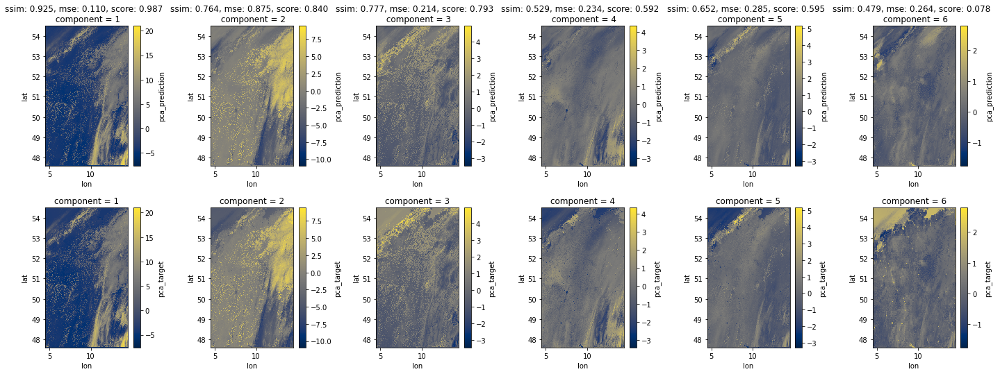

In [24]:
pca_target_pca_prediction_3D(ds_out, path_output = path_output, name_plot = "x" + 'pca_target_pred_img_k_fold_1', plot_type = "pca")


0.9840707746506827

 ================ number of channels 36
score channel 1: 0.9428988020618545
score channel 2: 0.7474223146914896
score channel 3: 0.9681117335653375
score channel 4: 0.9555062766414186
score channel 5: 0.7800786136759383
score channel 6: 0.882312327482168
score channel 7: 0.9120577457087045
score channel 8: 0.9754147539190307
score channel 9: 0.9710134600683968
score channel 10: 0.965636870809151
score channel 11: 0.9466880744978279
score channel 12: 0.9539819456744837
score channel 13: 0.9467513516803041
score channel 14: 0.9492399986797914
score channel 15: 0.8102411378378371
score channel 16: 0.7412827811634983
score channel 17: 0.7942414702821663
score channel 18: 0.8934551208085687
score channel 19: 0.8566799803594296
score channel 20: 0.8063948979385456
score channel 21: 0.7074156442795526
score channel 22: 0.6999010261003412
score channel 23: 0.7755529725620851
score channel 24: 0.886376561040094
score channel 25: 0.9175633217556722
score channel 26: -30.364062741480478
score cha

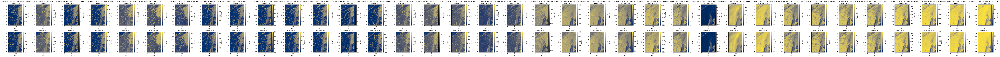

In [25]:
score_list, ssmi_list = plot_target_prediction_3D(ds_out, path_output = path_output, name_plot = "RF" + 'pca_target_pred_img_k_fold_1', plot_type = "spectral")


In [26]:
print("ssim")

for i in np.arange(0,len(ssmi_list),1):
    print(i+1, ssmi_list[i])

ssim
1 0.9866217554967798
2 0.9175787318864708
3 0.9922133945847398
4 0.9896184843440353
5 0.9255110776353496
6 0.9344240807340527
7 0.959112641730545
8 0.9919354079754646
9 0.9923398154819963
10 0.9918957654388117
11 0.9907744889376362
12 0.9898746604082992
13 0.9853026804692774
14 0.9850157572021089
15 0.9307915166915888
16 0.9158644604045622
17 0.9288301215079847
18 0.9506104387471814
19 0.9429184004779664
20 0.9347534574543601
21 0.9028556546792573
22 0.9023418159690864
23 0.9289728540417918
24 0.9990181396705097
25 0.9882993323776759
26 0.9730636091972004
27 0.9626228533937615
28 0.956090294928858
29 0.9177080800515968
30 0.9345461871694533
31 0.920340346916412
32 0.9235441145339904
33 0.9606429551339435
34 0.9763018226003205
35 0.9850777709040209
36 0.9946902992639075


<xarray.DataArray 'prediction' ()>
array(-0.01080406)
Coordinates:
    channel  int64 26 <xarray.DataArray 'prediction' ()>
array(0.34917895)
Coordinates:
    channel  int64 26


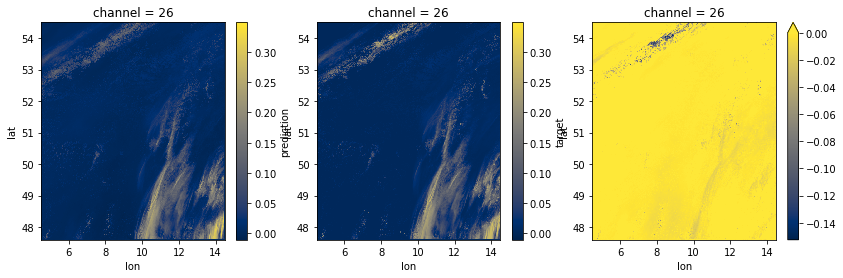

In [32]:
n =25 
fig = plt.figure(figsize=(14, 4))

print(ds_out['prediction'][n].min(), ds_out['prediction'][n].max())
plt.subplot(131)
ds_out['prediction'][n].plot(vmin=ds_out['prediction'][n].min(), vmax= ds_out['prediction'][n].max(), cmap='cividis') 
plt.subplot(132)
ds_out['target'][n].plot(vmin= ds_out['prediction'][n].min(), vmax= ds_out['prediction'][n].max(), cmap='cividis')
plt.subplot(133)
(ds_out['prediction'][n]-ds_out['target'][n]).plot(vmax= 0.0, cmap='cividis') 


In [33]:
from sklearn.metrics import r2_score
from sklearn import metrics
result_score = r2_score(ds_out['target'].values.flatten(), ds_out['prediction'].values.flatten())
result_score

0.9982469536251329

In [34]:
ds_out['pca_prediction'].shape


(6, 628, 589)

In [35]:
from sklearn.metrics import r2_score
from sklearn import metrics
n =5
result_score = r2_score(ds_out['pca_prediction'][n].values.flatten(), ds_out['pca_target'][n].values.flatten())
result_score

-1.1147051796980514

In [36]:
print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(ds_out['pca_prediction'][:6].values.flatten(), ds_out['pca_prediction'][:6].values.flatten()))


Mean Absolute Error (MAE): 0.0


In [37]:
columns = inputs_after_PCA_StandardScaler

NameError: name 'inputs_after_PCA_StandardScaler' is not defined

In [40]:
# importing the pandas library
import pandas as pd
# path_output= "/home/b/b381362/output/RF_changepara"  
# path_output= "/home/b/b381362/output/RF_drop1000more"  
path_output= "/home/b/b381362/output/pca_allinput"  

# reading the csv file using read_csv
# storing the data frame in variable called df
df = pd.read_csv(path_output +'/inputs_after_PCA_StandardScaler.csv')
 
# creating a list of column names by
# calling the .columns
list_of_column_names = list(df.columns)
 
# displaying the list of column names
print('List of column names : ',
      list_of_column_names[1:])

List of column names :  ['Nd_max', 'lwp', '3D_PCA_0', '3D_PCA_1', '3D_PCA_2', '3D_PCA_3', '3D_PCA_4', '3D_PCA_5', '3D_PCA_6', '3D_PCA_7', '3D_PCA_8', '3D_PCA_9', '3D_PCA_10', '3D_PCA_11', '3D_PCA_12', '3D_PCA_13', '3D_PCA_14', '3D_PCA_15', '3D_PCA_16', '3D_PCA_17', '3D_PCA_18', '3D_PCA_19', '3D_PCA_20', '3D_PCA_21', '3D_PCA_22', '3D_PCA_23', '3D_PCA_24', '3D_PCA_25', '3D_PCA_26', '3D_PCA_27', '3D_PCA_28', '3D_PCA_29', '3D_PCA_30', '3D_PCA_31', '3D_PCA_32', '3D_PCA_33', '3D_PCA_34', '3D_PCA_35', '3D_PCA_36', '3D_PCA_37', '3D_PCA_38', '3D_PCA_39', '3D_PCA_40', '3D_PCA_41', '3D_PCA_42', '3D_PCA_43', '3D_PCA_44', '3D_PCA_45', '3D_PCA_46', '3D_PCA_47', '3D_PCA_48', '3D_PCA_49', '3D_PCA_50', '3D_PCA_51', '3D_PCA_52', '3D_PCA_53', '3D_PCA_54', '3D_PCA_55', '3D_PCA_56', '3D_PCA_57', '3D_PCA_58', '3D_PCA_59', '3D_PCA_60', '3D_PCA_61', '3D_PCA_62', '3D_PCA_63', '3D_PCA_64', '3D_PCA_65', '3D_PCA_66', '3D_PCA_67', '3D_PCA_68', '3D_PCA_69', '3D_PCA_70', '3D_PCA_71', '3D_PCA_72', '3D_PCA_73', '3D_PC

In [55]:
import pandas as pd
import joblib
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'
k =5


model = joblib.load(path_output +"/RF_k_fold_{}.joblib".format(k))

feature_scores = pd.Series(model.feature_importances_, index = list_of_column_names[1:]).sort_values(ascending=False)
print(color.BOLD + " Feature score (k = {}) ".format(k) + color.END)
print(feature_scores)

print("- lwp:", "{:.6f}".format(feature_scores["lwp"]))
print("- Nd_max:", "{:.6f}".format(feature_scores["Nd_max"]))



 Feature score (k = 5) 
Nd_max       0.580118
3D_PCA_1     0.198361
3D_PCA_0     0.118283
3D_PCA_8     0.021125
3D_PCA_4     0.015658
               ...   
3D_PCA_70    0.000013
3D_PCA_72    0.000010
3D_PCA_80    0.000009
3D_PCA_84    0.000008
3D_PCA_89    0.000006
Length: 92, dtype: float64
- lwp: 0.000020
- Nd_max: 0.580118


In [109]:
print("Nd_max:",feature_scores["Nd_max"])
print("lwp:",feature_scores["lwp"])

Nd_max: 0.4612610253027227
lwp: 6.910528315647511e-05


In [45]:
feature_scores["Nd_max"]

1.5055816562380838e-05

In [41]:
feature_scores["lwp"]

0.5087801213579567

In [39]:
feature_scores["Nd_max"]

3.0466581240413194e-05

# Old code

In [2]:
path_output= "/home/b/b381362/output/ML_output"  

path_pred_target = path_output + "/output_target.nc"


In [3]:
ds_out = xr.open_dataset(path_pred_target)

In [4]:
ds_out

<xarray.Dataset>
Dimensions:           (lat: 628, lon: 589)
Coordinates:
  * lat               (lat) float32 47.6 47.61 47.62 47.63 ... 54.47 54.49 54.5
  * lon               (lon) float32 4.5 4.517 4.534 4.551 ... 14.46 14.48 14.5
Data variables:
    refl_emis_pred    (lat, lon) float64 ...
    refl_emis_target  (lat, lon) float64 ...

In [5]:
ds_out['refl_emis_pred'][2].min().values, ds_out['refl_emis_pred'][2].max().values


(array(-5.23198871), array(17.59097722))

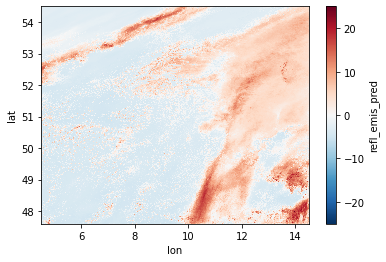

In [6]:
ds_out['refl_emis_pred'].plot() #vmin=0.1, vmax= 0.8)# cmap='cividis', 


In [7]:
path_output= "/home/b/b381362/output/RF_testcode"  

path_pred_target = path_output + "/outputs_target_pred_testing_T09.nc"
ds_out = xr.open_dataset(path_pred_target)
ds_out

<xarray.Dataset>
Dimensions:         (channel: 36, lat: 628, lon: 589)
Coordinates:
  * channel         (channel) int64 1 2 3 4 5 6 7 8 ... 29 30 31 32 33 34 35 36
  * lat             (lat) float32 47.6 47.61 47.62 47.63 ... 54.47 54.49 54.5
  * lon             (lon) float32 4.5 4.517 4.534 4.551 ... 14.46 14.48 14.5
Data variables:
    prediction      (channel, lat, lon) float64 ...
    target          (channel, lat, lon) float64 ...
    pca_prediction  (channel, lat, lon) float64 ...
    pca_target      (channel, lat, lon) float64 ...

In [8]:
ds_out.dims

Frozen({'channel': 36, 'lat': 628, 'lon': 589})

In [9]:
ds_out.coords.values

<bound method Mapping.values of Coordinates:
  * channel  (channel) int64 1 2 3 4 5 6 7 8 9 10 ... 28 29 30 31 32 33 34 35 36
  * lat      (lat) float32 47.6 47.61 47.62 47.63 ... 54.46 54.47 54.49 54.5
  * lon      (lon) float32 4.5 4.517 4.534 4.551 ... 14.44 14.46 14.48 14.5>

In [10]:
n = 6 
ds_out['prediction'][n].min().values, ds_out['prediction'][n].max().values


(array(-0.00150815), array(0.44134637))

In [11]:
ds_out['target'][n].min().values, ds_out['target'][n].max().values


(array(0.00447073), array(0.43700576))

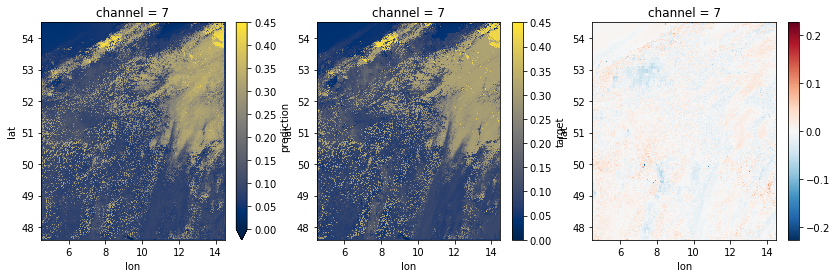

In [12]:
fig = plt.figure(figsize=(14, 4))

plt.subplot(131)
ds_out['prediction'][n].plot(vmin=0.0, vmax= 0.45, cmap='cividis') #robust=True, cmap='cividis') 
plt.subplot(132)
ds_out['target'][n].plot(vmin=0.0, vmax= 0.45, cmap='cividis') #robust=True, cmap='cividis')  #vmin=0.0, vmax= 0.45, cmap='cividis')
plt.subplot(133)
(ds_out['prediction'][n]-ds_out['target'][n]).plot()#vmax= 0.0)#, cmap='bwr') 


# load model

In [18]:
import joblib

loaded_rf = joblib.load(path_output +"/random_forest_checkit.joblib")

In [25]:
from sklearn.metrics import r2_score
from sklearn import metrics
result_score = r2_score(ds_out['target'].values.flatten(), ds_out['prediction'].values.flatten())
result_score

0.9994635996687546

In [26]:
print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(ds_out['target'].values.flatten(), ds_out['prediction'].values.flatten()))


Mean Absolute Error (MAE): 0.02031895230899757


In [27]:
model = loaded_rf

feature_scores = pd.Series(model.feature_importances_, index = x_train.columns).sort_values(ascending=False)
print(" ========== Feature score ========== ")
print(feature_scores)


NameError: name 'pd' is not defined

In [ ]:

f, ax = plt.subplots(figsize=(30, 24))
ax = sns.barplot(x=feature_scores, y=feature_scores.index, data = x_train)
ax.set_title("Visualize feature scores of the features")
ax.set_yticklabels(feature_scores.index)
ax.set_xlabel("Feature importance score")
ax.set_ylabel("Features")
plt.show()
figure_name = '{}/feature importances.png'.format(path_output) #aca pasarr con todo path

f.tight_layout()

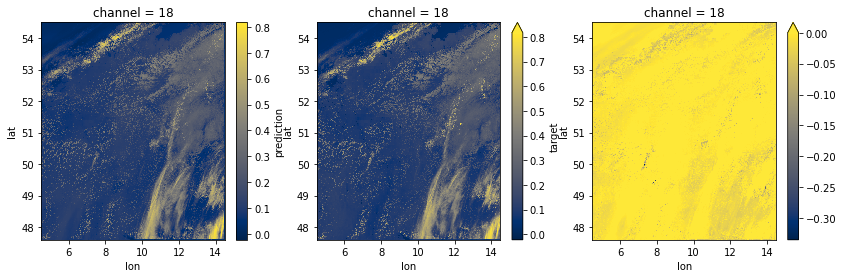

In [14]:
n =17
fig = plt.figure(figsize=(14, 4))

plt.subplot(131)
ds_out['prediction'][n].plot(vmin=ds_out['prediction'][n].min(), vmax= ds_out['prediction'][n].max(), cmap='cividis') 
plt.subplot(132)
ds_out['target'][n].plot(vmin= ds_out['prediction'][n].min(), vmax= ds_out['prediction'][n].max(), cmap='cividis')
plt.subplot(133)
(ds_out['prediction'][n]-ds_out['target'][n]).plot(vmax= 0.0, cmap='cividis') 


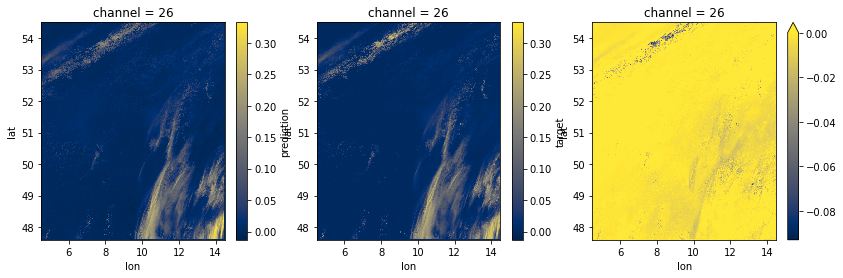

In [22]:
n =25 
fig = plt.figure(figsize=(14, 4))

plt.subplot(131)
ds_out['prediction'][n].plot(vmin=ds_out['prediction'][n].min(), vmax= ds_out['prediction'][n].max(), cmap='cividis') 
plt.subplot(132)
ds_out['target'][n].plot(vmin= ds_out['prediction'][n].min(), vmax= ds_out['prediction'][n].max(), cmap='cividis')
plt.subplot(133)
(ds_out['prediction'][n]-ds_out['target'][n]).plot(vmax= 0.0, cmap='cividis') 


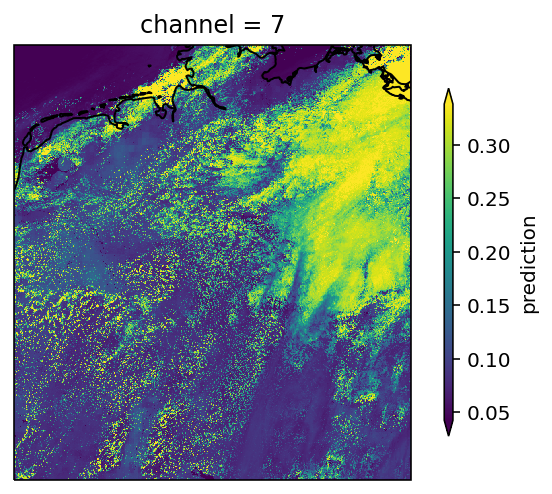

In [49]:
import cartopy.crs as ccrs
import matplotlib as mpl
import matplotlib.pyplot as plt
%config InlineBackend.figure_format='retina'

fig, axis = plt.subplots(1, 1, subplot_kw=dict(projection=ccrs.Mercator()))

ds_out['prediction'][n].plot(
    ax=axis,
    # col="month",
    transform=ccrs.PlateCarree(),  # remember to provide this!
    # subplot_kws={"projection": ccrs.Mercator()},
    cbar_kwargs={"orientation": "vertical", "shrink": 0.8, "aspect": 40},
    robust=True,
)



# lets add a coastline to each axis
# great reason to use FacetGrid.map
axis.coastlines()  # cartopy function

In [7]:
int(ds_out.prediction.channel[35])

36

In [46]:
ds_out.channel[35]

<xarray.DataArray 'channel' ()>
array(36)
Coordinates:
    channel  int64 36

In [3]:
# path_dataset = "/home/jvillarreal/Documents/phd/dataset"
# path_out = "/home/jvillarreal/Documents/phd/output"

path_dataset="/work/bb1036/b381362/dataset" 
path_out="/home/b/b381362/output"   

path_ICON = path_dataset + "/data_rttov_T12_dropupbottom_Reff.nc"
rttov_path_refl_emmis = path_out+ "/output-rttov/rttov-131-data-icon-1to19-26-T12.nc"
rttov_path_rad = path_out + "/output-rttov/rttov-13-data-icon-1-to-36-not-flip.nc"

In [4]:
path_data_in= "/work/bb1036/b381362/dataset_icon"
# path_ICON_vi = path_data_in + "/2d_surface_day_DOM03_ML_20130502T120000Z.nc"
path_ICON_vi = path_data_in + "/3d_coarse_day_ll_DOM03_ML_20130502T120000Z.nc"

In [5]:
path_rttov_test = path_out + "/output-rttov/rttov-131-data-icon-1to36-T09.nc"
# path_ICON_test = "/home/jvillarreal/Documents/phd/dataset/data_rttov_T09_dropupbottom_Reff.nc"

In [6]:
ds_vi = xr.open_dataset(path_ICON_vi)

In [7]:
ds_vi

<xarray.Dataset>
Dimensions:      (lon: 589, lat: 637, height: 150, bnds: 2, height_2: 151,
                  time: 12)
Coordinates:
  * lon          (lon) float64 4.5 4.517 4.534 4.551 ... 14.45 14.46 14.48 14.5
  * lat          (lat) float64 47.5 47.51 47.52 47.53 ... 54.46 54.47 54.48 54.5
  * height       (height) float64 1.0 2.0 3.0 4.0 ... 147.0 148.0 149.0 150.0
  * height_2     (height_2) float64 1.0 2.0 3.0 4.0 ... 148.0 149.0 150.0 151.0
  * time         (time) float64 2.013e+07 2.013e+07 ... 2.013e+07 2.013e+07
Dimensions without coordinates: bnds
Data variables: (12/22)
    height_bnds  (height, bnds) float64 ...
    hus          (time, height, lat, lon) float32 ...
    clw          (time, height, lat, lon) float32 ...
    cli          (time, height, lat, lon) float32 ...
    qr           (time, height, lat, lon) float32 ...
    qs           (time, height, lat, lon) float32 ...
    ...           ...
    va           (time, height, lat, lon) float32 ...
    wa           (time, height_2, lat, lon) float32 ...
    ta           (time, height, lat, lon) float32 ...
    pres         (time, height, lat, lon) float32 ...
    tkvh         (time, height_2, lat, lon) float32 ...
    clc          (time, height, lat, lon) float32 ...
Attributes:
    CDI:          Climate Data Interface version 1.7.2 (http://mpimet.mpg.de/...
    Conventions:  CF-1.4
    uuidOfVGrid:  3be5ac35-92f4-4e91-7418-b62336222e20
    institution:  Max Planck Institute for Meteorology/Deutscher Wetterdienst
    title:        ICON simulation
    source:       git@git.mpimet.mpg.de:icon-lem.git@a67e3681e4833c13bb195f60...
    history:      /work/bm0834/k203095/icon-lem-alpha/icon-lem-readccn/build/...
    references:   see MPIM/DWD publications
    comment:      HDCP2 Sammelaccount (k203095) on m21726 (Linux 2.6.32-696.1...

In [8]:
ds_vi.hus.isel[6,:,9:,:].plot(
    x="height",  # coordinate to plot on the x-axis of the plot
    robust=True,  # set colorbar limits to 2nd and 98th percentile of data
    cbar_kwargs={  # passed to plt.colorbar
        "orientation": "horizontal",
        "label": "custom label",
        "pad": 0.3,
    },
)

TypeError: 'method' object is not subscriptable

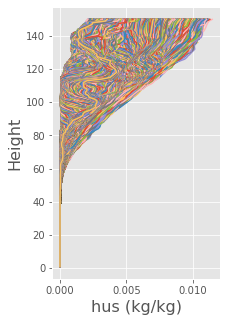

In [30]:
var = ds_vi.hus[6,:,9:,:].values
var = var.transpose(1,2,0) #lat,lot,heigh

X = var.reshape(-1, var.shape[2])   #df_x_train [f"{key}_{i}" for i in range(150)]
wl = np.arange(1, 151, 1)

fig = plt.figure(figsize=(3, 5))

with plt.style.context('ggplot'):
    plt.plot(X.T, wl)  #only for showing 50 points
    plt.ylabel("Height", fontsize=16)
    plt.xlabel("hus (kg/kg)", fontsize=16)

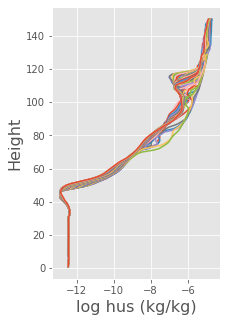

In [31]:
var = np.log(ds_vi.hus[6,:,9:,:]).values
var = var.transpose(1,2,0) #lat,lot,heigh

X = var.reshape(-1, var.shape[2])   #df_x_train [f"{key}_{i}" for i in range(150)]
wl = np.arange(1, 151, 1)

fig = plt.figure(figsize=(3, 5))

with plt.style.context('ggplot'):
    plt.plot(X[:50].T, wl)  #only for showing 50 points
    plt.ylabel("Height", fontsize=16)
    plt.xlabel("log hus (kg/kg)", fontsize=16)

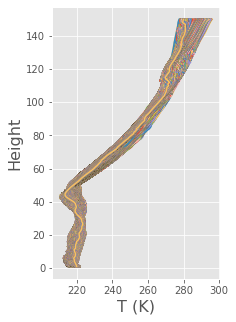

In [30]:
var = ds_vi.ta[6,:,9:,:].values
var = var.transpose(1,2,0) #lat,lot,heigh
X = var.reshape(-1, var.shape[2])   #df_x_train [f"{key}_{i}" for i in range(150)]
wl = np.arange(1, 151, 1)

fig = plt.figure(figsize=(3, 5))

with plt.style.context('ggplot'):
    plt.plot(X.T, wl)  #only for showing 50 points #[:50]
    plt.ylabel("Height", fontsize=16)
    plt.xlabel("T (K)", fontsize=16)

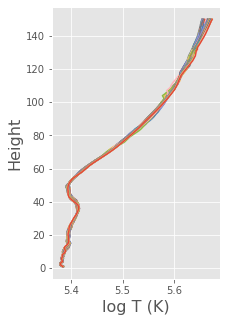

In [87]:
var = np.log(ds_vi.ta[6,:,9:,:].values)
var = var.transpose(1,2,0) #lat,lot,heigh
X = var.reshape(-1, var.shape[2])   #df_x_train [f"{key}_{i}" for i in range(150)]
wl = np.arange(1, 151, 1)

fig = plt.figure(figsize=(3, 5))

with plt.style.context('ggplot'):
    plt.plot(X[:50].T, wl)  #only for showing 50 points #[:50]
    plt.ylabel("Height", fontsize=16)
    plt.xlabel("log T (K)", fontsize=16)

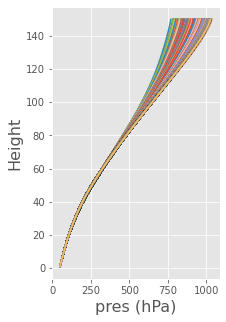

In [28]:
var = ds_vi.pres[6,:,9:,:].values
var = var.transpose(1,2,0) #lat,lot,heigh
X = var.reshape(-1, var.shape[2])   #df_x_train [f"{key}_{i}" for i in range(150)]
wl = np.arange(1, 151, 1)

fig = plt.figure(figsize=(3, 5))

with plt.style.context('ggplot'):
    plt.plot(X.T/100, wl)  #only for showing 50 points #[:90]
    plt.ylabel("Height", fontsize=16)
    plt.xlabel("pres (hPa)", fontsize=16)

(150,)
(90, 150)
(150, 90)


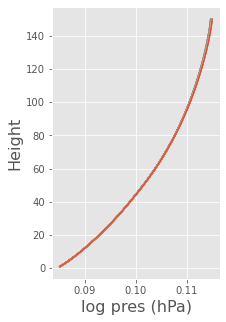

In [89]:
var = np.log(ds_vi.pres[6,:,9:,:]).values
var = var.transpose(1,2,0) #lat,lot,heigh
X = var.reshape(-1, var.shape[2])   #df_x_train [f"{key}_{i}" for i in range(150)]
wl = np.arange(1, 151, 1)
print(np.shape(wl))
fig = plt.figure(figsize=(3, 5))
print(np.shape(X[:90]))
print(np.shape(X[:90].T))

with plt.style.context('ggplot'):
    plt.plot(X[:50].T/100, wl)  #only for showing 50 points #[:90]
    plt.ylabel("Height", fontsize=16)
    plt.xlabel("log pres (hPa)", fontsize=16)

In [9]:
ds = xr.open_dataset(path_ICON) #.compute() #the compute make it more heavy check code example


In [10]:
ds

<xarray.Dataset>
Dimensions:       (lat: 628, lon: 589, height: 150)
Coordinates:
  * height        (height) float64 1.0 2.0 3.0 4.0 ... 147.0 148.0 149.0 150.0
  * lat           (lat) float64 47.6 47.61 47.62 47.63 ... 54.47 54.48 54.5
  * lon           (lon) float64 4.5 4.517 4.534 4.551 ... 14.45 14.46 14.48 14.5
Data variables: (12/20)
    FR_LAND       (lat, lon) float32 ...
    clc           (height, lat, lon) float32 ...
    cli           (height, lat, lon) float32 ...
    clw           (height, lat, lon) float32 ...
    clwvi         (lat, lon) float32 ...
    hus           (height, lat, lon) float32 ...
    ...            ...
    u_10m         (lat, lon) float32 ...
    v_10m         (lat, lon) float32 ...
    lwp           (lat, lon) float32 ...
    Nd_max        (lat, lon) float64 ...
    Nd            (height, lat, lon) float64 ...
    Reff          (height, lat, lon) float64 ...
Attributes:
    CDI:          Climate Data Interface version 1.9.10 (https://mpimet.mpg.d...
    Conventions:  CF-1.4
    uuidOfVGrid:  3be5ac35-92f4-4e91-7418-b62336222e20
    title:        ICON simulation
    history:      Sun Jun 19 21:06:20 2022: ncks -d lat,47.599,54.5 /work/bb1...
    references:   see MPIM/DWD publications
    comment:      HDCP2 Sammelaccount (k203095) on m21726 (Linux 2.6.32-696.1...
    NCO:          netCDF Operators version 5.0.6 (Homepage = http://nco.sf.ne...
    CDO:          Climate Data Operators version 1.9.10 (https://mpimet.mpg.d...

In [7]:
ds.lat[624]

<xarray.DataArray 'lat' ()>
array(54.463)
Coordinates:
    lat      float64 54.46
Attributes:
    standard_name:  latitude
    long_name:      latitude
    units:          degrees_north
    axis:           Y

In [26]:
ds_x_train = ds.sel(lat=slice(47.5, 53.09))
ds_x_train

<xarray.Dataset>
Dimensions:       (lat: 500, lon: 589, height: 150)
Coordinates:
  * height        (height) float64 1.0 2.0 3.0 4.0 ... 147.0 148.0 149.0 150.0
  * lat           (lat) float64 47.6 47.61 47.62 47.63 ... 53.07 53.08 53.09
  * lon           (lon) float64 4.5 4.517 4.534 4.551 ... 14.45 14.46 14.48 14.5
Data variables: (12/20)
    FR_LAND       (lat, lon) float32 ...
    clc           (height, lat, lon) float32 ...
    cli           (height, lat, lon) float32 ...
    clw           (height, lat, lon) float32 ...
    clwvi         (lat, lon) float32 ...
    hus           (height, lat, lon) float32 ...
    ...            ...
    u_10m         (lat, lon) float32 ...
    v_10m         (lat, lon) float32 ...
    lwp           (lat, lon) float32 ...
    Nd_max        (lat, lon) float64 ...
    Nd            (height, lat, lon) float64 ...
    Reff          (height, lat, lon) float64 ...
Attributes:
    CDI:          Climate Data Interface version 1.9.10 (https://mpimet.mpg.d...
    Conventions:  CF-1.4
    uuidOfVGrid:  3be5ac35-92f4-4e91-7418-b62336222e20
    title:        ICON simulation
    history:      Sun Jun 19 21:06:20 2022: ncks -d lat,47.599,54.5 /work/bb1...
    references:   see MPIM/DWD publications
    comment:      HDCP2 Sammelaccount (k203095) on m21726 (Linux 2.6.32-696.1...
    NCO:          netCDF Operators version 5.0.6 (Homepage = http://nco.sf.ne...
    CDO:          Climate Data Operators version 1.9.10 (https://mpimet.mpg.d...

In [6]:
ds_x_train = xr.concat([ds.sel(lat=slice(47.5, 48.97)), ds.sel(lat=slice(50.34, 54.47))], dim="lat") #48.97, 54.47, 50.34, 54.47))
# xr.concat([da.isel(y=slice(0, 1)), da.isel(y=slice(1, None))], dim="y")
ds_x_train

<xarray.Dataset>
Dimensions:       (lat: 500, lon: 589, height: 150)
Coordinates:
  * height        (height) float64 1.0 2.0 3.0 4.0 ... 147.0 148.0 149.0 150.0
  * lat           (lat) float64 47.6 47.61 47.62 47.63 ... 54.44 54.45 54.46
  * lon           (lon) float64 4.5 4.517 4.534 4.551 ... 14.45 14.46 14.48 14.5
Data variables: (12/20)
    FR_LAND       (lat, lon) float32 1.0 1.0 1.0 1.0 1.0 ... 0.0 0.0 0.0 0.0 0.0
    clc           (height, lat, lon) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    cli           (height, lat, lon) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    clw           (height, lat, lon) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    clwvi         (lat, lon) float32 0.0 0.0 0.0 0.009863 ... 0.097 0.067 0.1359
    hus           (height, lat, lon) float32 3.905e-06 3.905e-06 ... 0.003986
    ...            ...
    u_10m         (lat, lon) float32 -3.281 -2.992 -3.662 ... -4.223 -4.201
    v_10m         (lat, lon) float32 -3.609 -2.783 1.22 ... -1.848 -2.105 -1.985
    lwp           (lat, lon) float32 0.0 0.0 0.0 9.863 ... 25.08 97.0 67.0 135.9
    Nd_max        (lat, lon) float64 0.0 0.0 0.0 12.24 ... 112.0 134.3 186.6
    Nd            (height, lat, lon) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    Reff          (height, lat, lon) float64 nan nan nan nan ... nan nan nan nan
Attributes:
    CDI:          Climate Data Interface version 1.9.10 (https://mpimet.mpg.d...
    Conventions:  CF-1.4
    uuidOfVGrid:  3be5ac35-92f4-4e91-7418-b62336222e20
    title:        ICON simulation
    history:      Sun Jun 19 21:06:20 2022: ncks -d lat,47.599,54.5 /work/bb1...
    references:   see MPIM/DWD publications
    comment:      HDCP2 Sammelaccount (k203095) on m21726 (Linux 2.6.32-696.1...
    NCO:          netCDF Operators version 5.0.6 (Homepage = http://nco.sf.ne...
    CDO:          Climate Data Operators version 1.9.10 (https://mpimet.mpg.d...

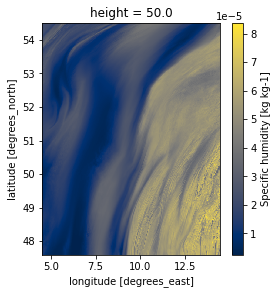

In [18]:
var = ds.hus.values

fig = plt.figure(figsize=(4, 1.066*4))
ds.hus.sel(height= 50).plot(cmap = "cividis")


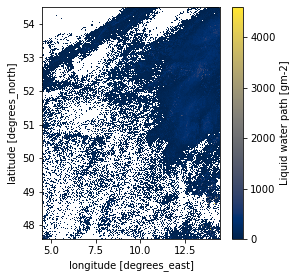

In [ ]:
var = ds.lwp.values

fig = plt.figure(figsize=(4, 1.066*4))
ds.lwp.where(ds.lwp > 0).plot(cmap = "cividis") #, vmin=2, vmax = 800) 


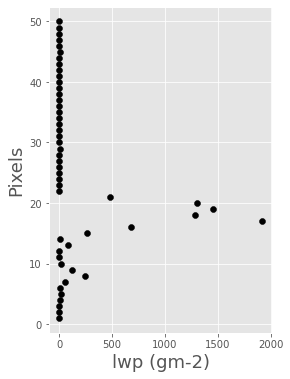

In [11]:
var = ds.lwp.values
#lat,lot
var_size = var.shape[0] * var.shape[1] 
X = var.flatten()
wl = np.arange(1, var_size+1, 1)

fig = plt.figure(figsize=(4, 6))

with plt.style.context('ggplot'):
    plt.scatter(X[:50], wl[:50], color="k")  #only for showing 50 points #[:50]
    plt.ylabel("Pixels", fontsize=18)
    plt.xlabel("lwp (gm-2)", fontsize=18)

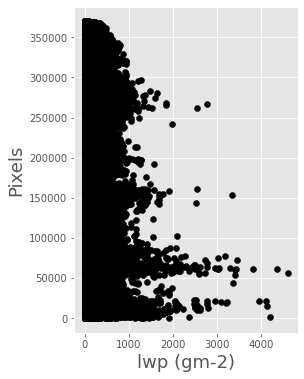

In [76]:
var = ds.lwp.values
#lat,lot
var_size = var.shape[0] * var.shape[1] 
X = var.flatten()
wl = np.arange(1, var_size+1, 1)

fig = plt.figure(figsize=(4, 6))

with plt.style.context('ggplot'):
    plt.scatter(X, wl, color="k")  #only for showing 50 points #[:50]
    plt.ylabel("Pixels", fontsize=18)
    plt.xlabel("lwp (gm-2)", fontsize=18)

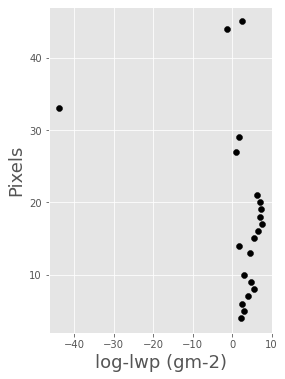

In [12]:
var = np.log(ds.lwp.where(ds.lwp != 0).values)
#lat,lot
var_size = var.shape[0] * var.shape[1] 
X = var.flatten()
wl = np.arange(1, var_size+1, 1)

fig = plt.figure(figsize=(4, 6))

with plt.style.context('ggplot'):
    plt.scatter(X[:50], wl[:50], color="k")  #only for showing 50 points #[:50]
    plt.ylabel("Pixels", fontsize=18)
    plt.xlabel("log-lwp (gm-2)", fontsize=18)

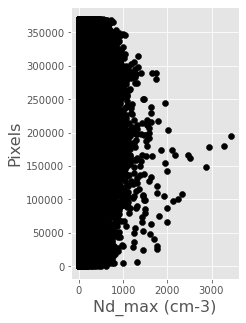

In [67]:
var = ds.Nd_max.values
#lat,lot
var_size = var.shape[0] * var.shape[1] 
X = var.flatten()
wl = np.arange(1, var_size+1, 1)

fig = plt.figure(figsize=(3, 5))

with plt.style.context('ggplot'):
    plt.scatter(X, wl, color="k")  #only for showing 50 points #[:50]
    plt.ylabel("Pixels", fontsize=18)
    plt.xlabel("Nd_max (cm-3)", fontsize=18)

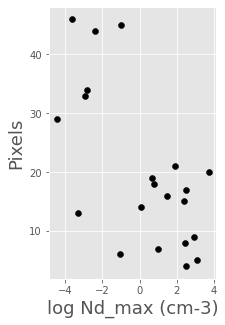

In [13]:
var = np.log(ds.Nd_max.where(ds.Nd_max != 0).values)
#lat,lot
var_size = var.shape[0] * var.shape[1] 
X = var.flatten()
wl = np.arange(1, var_size+1, 1)

fig = plt.figure(figsize=(3, 5))

with plt.style.context('ggplot'):
    plt.scatter(X[:50], wl[:50], color="k")  #only for showing 50 points #[:50]
    plt.ylabel("Pixels", fontsize=18)
    plt.xlabel("log Nd_max (cm-3)", fontsize=18)

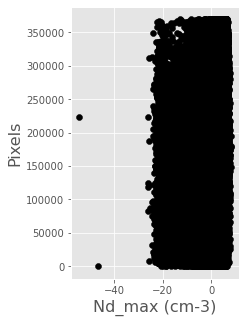

In [68]:
var = np.log(ds.Nd_max.where(ds.Nd_max != 0).values)
#lat,lot
var_size = var.shape[0] * var.shape[1] 
X = var.flatten()
wl = np.arange(1, var_size+1, 1)

fig = plt.figure(figsize=(3, 5))

with plt.style.context('ggplot'):
    plt.scatter(X, wl, color="k")  #only for showing 50 points #[:50]
    plt.ylabel("Pixels", fontsize=18)
    plt.xlabel("Nd_max (cm-3)", fontsize=18)

In [16]:
ds_x_train = ds
var = ds.lwp.values


x_train_2D = { "Nd_max": ds_x_train.Nd_max.values, "lwp": ds_x_train.lwp.values}  

df_x_train = pd.DataFrame()
    
for key, var in x_train_2D.items():  
    df = pd.DataFrame(data = var.flatten()
         , columns =  [key])
    df_x_train = pd.concat([df_x_train, df], axis=1)  

In [17]:
df_x_train

,Nd_max,lwp
0,0.000000,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,12.242780,9.863123
4,22.199962,21.408985
...,...,...
369887,61.928620,8.889302
369888,8.552532,0.205387
369889,90.854551,11.893167
369890,99.569847,82.313011


In [21]:
count_zero_lwp = (df_x_train['lwp'] == 0).sum()
count_zero_Nd_max = (df_x_train['Nd_max'] == 0).sum()

count_zero_lwp, count_zero_Nd_max, count_zero_lwp - count_zero_Nd_max

(157627, 117448, 40179)

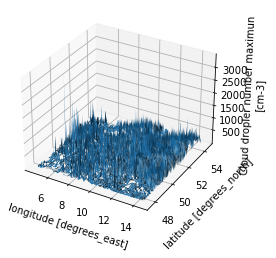

In [37]:
ds.Nd_max.where(ds.Nd_max > 2).plot.surface()

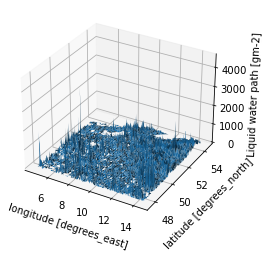

In [38]:
ds.lwp.where(ds.lwp != 0).plot.surface()

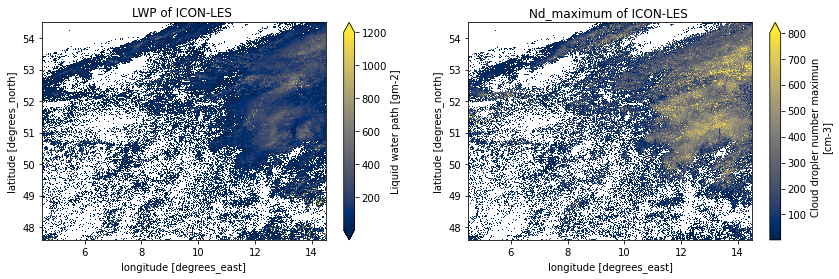

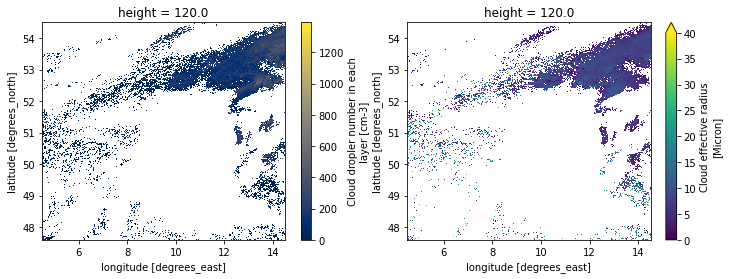

In [39]:
fig = plt.figure(figsize=(14, 4))
plt.subplot(121)
ds.lwp.where(ds.lwp != 0).plot(cmap = "cividis", vmin=2, vmax = 1200)
plt.gca().set_title(f"LWP of ICON-LES ")
plt.subplot(122)
ds.Nd_max.where(ds.Nd_max > 2).plot(cmap = "cividis", vmin=2, vmax = 800) 
plt.gca().set_title(f"Nd_maximum of ICON-LES ")



fig = plt.figure(figsize=(12, 4))
plt.subplot(121)
ds.Nd[119,:,:].where(ds.Nd[119,:,:] != 0).plot(cmap = "cividis") #,vmin=2, vmax = 800)
plt.subplot(122)
# ds.Reff[119].where(ds.Reff != 0).plot(cmap = "jet",vmin=2, vmax = 800)
ds.Reff[119,:,].plot(vmin=0, vmax = 40)


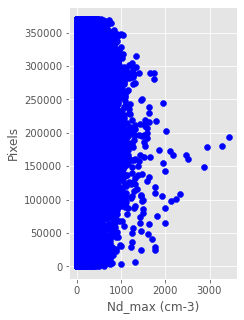

In [4]:
# ds_vi = xr.open_dataset(path_ICON_vi, chunks={'time': 1})

In [ ]:
ds

In [7]:
from scipy.signal import savgol_filter

# Plot the data
wl = np.arange(1, 590, 1)
wl
    
print(len(wl))

X = ds.Nd_max.values  
np.shape(X)

589


(628, 589)

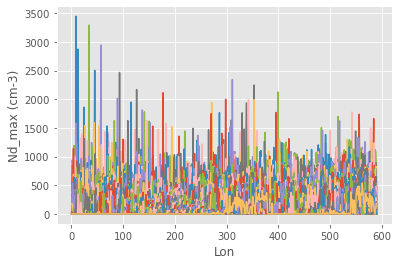

In [8]:
wl = np.arange(1, 590, 1)

with plt.style.context('ggplot'):
    plt.plot(wl, X[:].T)  #only for showing 50 points
    plt.xlabel("Lon")
    plt.ylabel("Nd_max (cm-3)")

In [9]:
ds.hus.shape

(150, 628, 589)

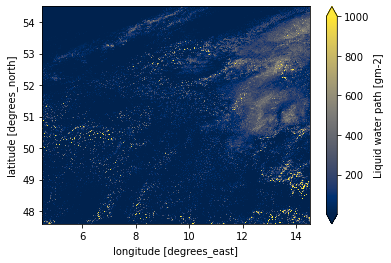

In [14]:
ds.lwp.plot(cmap = "cividis",vmin=1, vmax = 1000)

(array([10952641.,  6758752.,  5357135.,  4762983.,  4553886.,  4483375.,
         4436222.,  4707007.,  5295659.,  4176140.]),
 array([  4933.3687,  14806.1455,  24678.922 ,  34551.7   ,  44424.473 ,
         54297.25  ,  64170.027 ,  74042.805 ,  83915.58  ,  93788.36  ,
        103661.13  ], dtype=float32),
 <BarContainer object of 10 artists>)

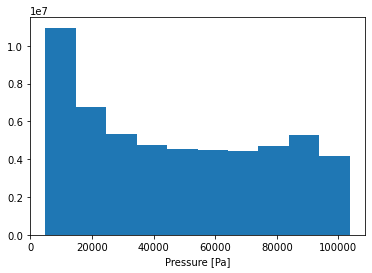

In [7]:
ds.pres.plot()

(array([5.5337365e+07, 1.4338500e+05, 2.7400000e+03, 2.1000000e+02,
        6.1000000e+01, 2.1000000e+01, 7.0000000e+00, 4.0000000e+00,
        3.0000000e+00, 4.0000000e+00]),
 array([   0.        ,  344.67592072,  689.35184145, 1034.02776217,
        1378.7036829 , 1723.37960362, 2068.05552435, 2412.73144507,
        2757.40736579, 3102.08328652, 3446.75920724]),
 <BarContainer object of 10 artists>)

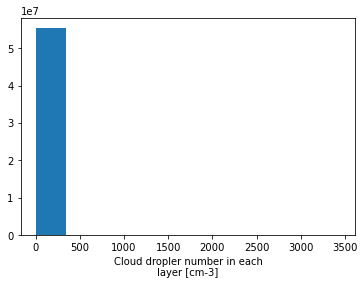

In [28]:
ds.Nd.plot()

In [ ]:
fig = px.histogram(df_x_train[df_x_train['Nd_max']>100 & df_x_train['Nd_max']<2000], x='Nd_max')
fig.show()

# Plotting output

In [52]:
import xarray as xr
import numpy as np
import argparse
import pprint
import matplotlib.pyplot as plt

rttov_path = "/work/bb1036/rttov_share/rttov-131-36-channels-05022013-07182022.nc"
# path_output = "/home/jvillarreal/Documents/phd/output/with_Reff"
type_variable = "refl_emis"

rttov_ds_refl_emmi = xr.open_dataset(rttov_path).compute()
# rttov_ds_refl_emmi = xr.open_dataset(rttov_path_refl_emmis).compute()

# 1-36
# 1-19,26: solar (2)
# 20-25: thermal+solar (1)
# 27-36: thermal (0)

# 0-35
# 0-18,25: solar (2)
# 19-24: thermal+solar (1)
# 26-35: thermal (0)

BRF_total_bnd = list(range(0, 19)) + list(range(25,26))
Radiance_total_bnd = list(range(19, 25)) + (list(range(26, 36)))
 

In [53]:
rttov_ds_refl_emmi

<xarray.Dataset>
Dimensions:          (Longitude: 589, Latitude: 628, Channel: 36)
Coordinates:
  * Longitude        (Longitude) float32 4.5 4.517 4.534 ... 14.46 14.48 14.5
  * Latitude         (Latitude) float32 47.6 47.61 47.62 ... 54.47 54.49 54.5
  * Channel          (Channel) float32 1.0 2.0 3.0 4.0 ... 33.0 34.0 35.0 36.0
Data variables:
    BRF_total        (Channel, Latitude, Longitude) float32 0.07597 ... 0.0
    BRF_clear        (Channel, Latitude, Longitude) float32 0.07597 ... 0.0
    BT_total         (Channel, Latitude, Longitude) float32 0.0 0.0 ... 225.5
    BT_clear         (Channel, Latitude, Longitude) float32 0.0 0.0 ... 225.5
    Radiance_total   (Channel, Latitude, Longitude) float32 30.85 ... 2.332
    Radiance_clear   (Channel, Latitude, Longitude) float32 30.85 ... 2.332
    Radiance_cloudy  (Channel, Latitude, Longitude) float32 1.283 ... 47.11
    BRDF             (Channel, Latitude, Longitude) float32 0.02048 ... 0.0
    Emissivity       (Channel, Latitude, Longitude) float32 0.0 0.0 ... 0.9578
    iwp_ret          (Latitude, Longitude) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
    iwp_model        (Latitude, Longitude) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0

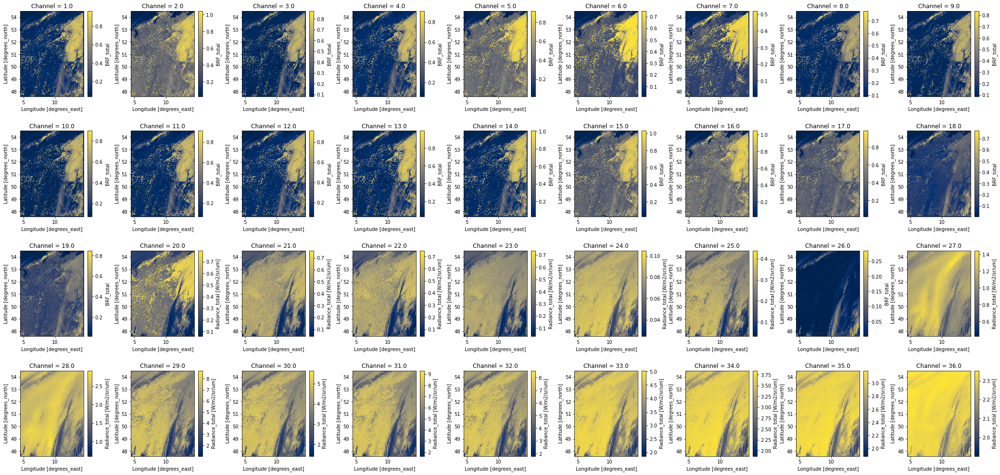

In [55]:
# rad and refl  

    
f, axes = plt.subplots(4,9,figsize=(4*9, 4*4*1.066)) #width of 15 inches and 7 inches in height.


f.subplots_adjust(wspace=0.4, hspace=0.4)


axli = axes.ravel()

for i in BRF_total_bnd:

    rttov_ds_refl_emmi['BRF_total'][i,:,:].plot(cmap='cividis', ax = axli[i]) #, vmin=0, vmax=0.65) 

for i in Radiance_total_bnd:
    rttov_ds_refl_emmi['Radiance_total'][i,:,:].plot(cmap='cividis', ax = axli[i]) #, vmin=0, vmax=0.65)


    

# plt.box(True)
title = 'simulations with Reff all channels V- OPAC'
output = "/home/b/b381362/output/"

figure_name = '{}{}.png'.format(output,title) #aca pasarr con todo path
f.savefig(figure_name, dpi=60)
# plt.close()
plt.show()

In [56]:
figure_name

'/home/b/b381362/output/simulations with Reff all channels V- OPAC.png'

In [25]:
rttov_ds_refl_emmi

<xarray.Dataset>
Dimensions:          (Longitude: 589, Latitude: 628, Channel: 36)
Coordinates:
  * Longitude        (Longitude) float32 4.5 4.517 4.534 ... 14.46 14.48 14.5
  * Latitude         (Latitude) float32 47.6 47.61 47.62 ... 54.47 54.49 54.5
  * Channel          (Channel) float32 1.0 2.0 3.0 4.0 ... 33.0 34.0 35.0 36.0
Data variables:
    BRF_total        (Channel, Latitude, Longitude) float32 0.07597 ... 0.0
    BRF_clear        (Channel, Latitude, Longitude) float32 0.07597 ... 0.0
    BT_total         (Channel, Latitude, Longitude) float32 0.0 0.0 ... 225.5
    BT_clear         (Channel, Latitude, Longitude) float32 0.0 0.0 ... 225.5
    Radiance_total   (Channel, Latitude, Longitude) float32 30.85 ... 2.332
    Radiance_clear   (Channel, Latitude, Longitude) float32 30.85 ... 2.332
    Radiance_cloudy  (Channel, Latitude, Longitude) float32 1.283 ... 47.11
    BRDF             (Channel, Latitude, Longitude) float32 0.02048 ... 0.0
    Emissivity       (Channel, Latitude, Longitude) float32 0.0 0.0 ... 0.9578
    iwp_ret          (Latitude, Longitude) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
    iwp_model        (Latitude, Longitude) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0

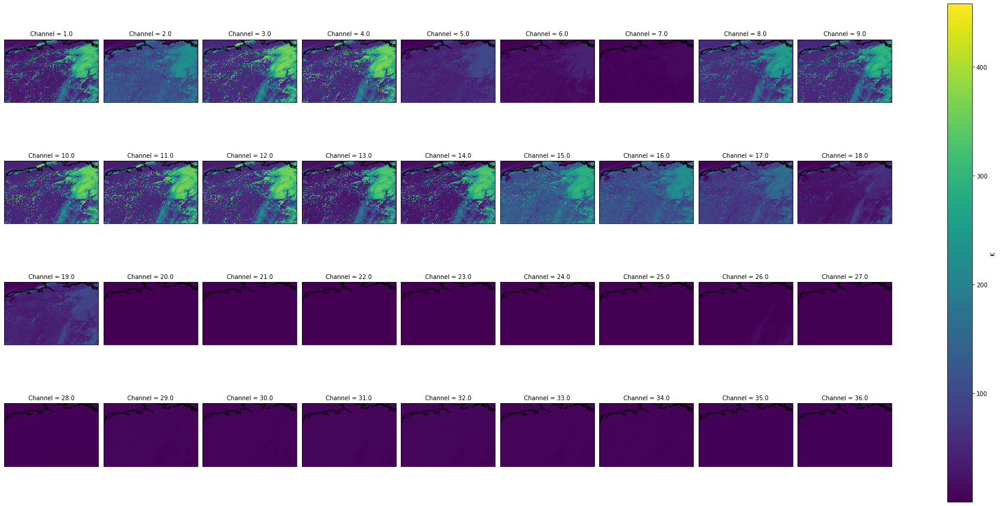

In [72]:
# testinf with projection  
import cartopy.crs as ccrs
proj = ccrs.PlateCarree() #Mercator
min_long = 4.5 #np.min(myd03_Longitude_data)
max_long = 14.5 #np.max(myd03_Longitude_data)
min_lat = 47.8 #np.min(myd03_Latitude_data)
max_lat = 54.5 #np.max(myd03_Latitude_data)
offset = 0.0

ease_extent = [min_long-offset, 
               max_long+offset, 
               min_lat-offset, 
               max_lat+offset]

map_proj = ccrs.PlateCarree()

# f, axes = plt.subplots(4,9,figsize=(50, 15), facecolor = 'white') #width of 15 inches and 7 inches in height.
# f.subplots_adjust(wspace=0.3, hspace=0.4)
# axli = axes.ravel()



p = rttov_ds_refl_emmi['Radiance_total'].plot(transform=ccrs.PlateCarree(),  # the data's projection
             col='Channel', col_wrap=9,  # multiplot settings
             aspect=rttov_ds_refl_emmi.dims['Longitude'] / rttov_ds_refl_emmi.dims['Latitude'],  # for a sensible figsize
             subplot_kws={'projection': map_proj},
             cbar_kwargs={"label": "K"})  # the plot's projection


# for i in range(36):
#     rttov_ds_refl_emmi['Radiance_total'][i,:,:].plot( cmap='cividis', ax = axli[i]) #, vmin=0, vmax=0.65)

    # We have to set the map's options on all axes
for ax in p.axes.flat:
    ax.coastlines()
    ax.set_extent(ease_extent)
    

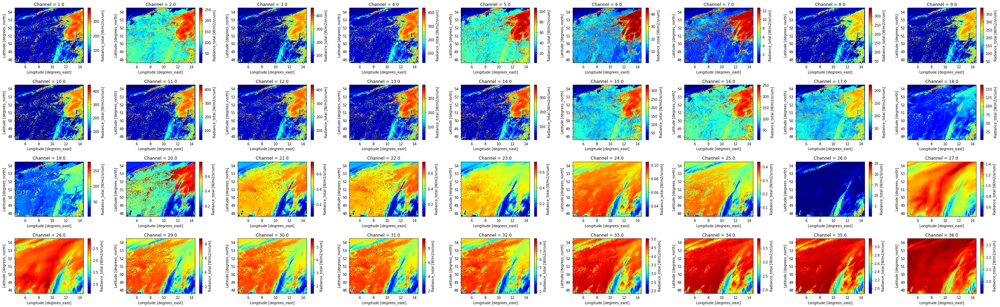

In [78]:
# radiances 
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
proj = ccrs.PlateCarree() #Mercator
min_long = 4.5 #np.min(myd03_Longitude_data)
max_long = 14.5 #np.max(myd03_Longitude_data)
min_lat = 47.8 #np.min(myd03_Latitude_data)
max_lat = 54.5 #np.max(myd03_Latitude_data)
offset = 0.0

ease_extent = [min_long-offset, 
               max_long+offset, 
               min_lat-offset, 
               max_lat+offset]


f, axes = plt.subplots(4,9,figsize=(50, 15), facecolor = 'white') #width of 15 inches and 7 inches in height.
f.subplots_adjust(wspace=0.3, hspace=0.4)
axli = axes.ravel()


for i in range(36):
    rttov_ds_refl_emmi['Radiance_total'][i,:,:].plot(cmap='jet', ax = axli[i]) #, vmin=0, vmax=0.65)
    # We have to set the map's options on all axes
# for ax in p.axes.flat:
#     ax.coastlines()
#     ax.set_extent(ease_extent)
    

RGB (628, 589, 3)
255
0.99609375


/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


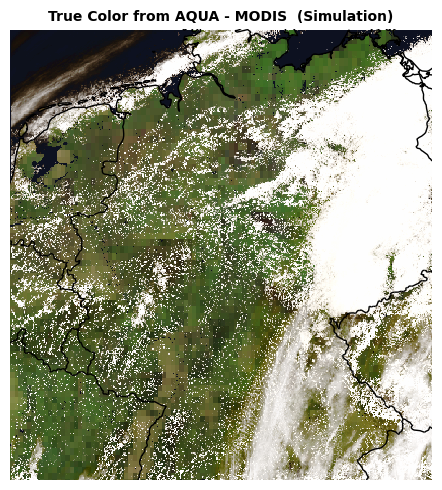

In [32]:
def bytescale(data, cmin=None, cmax=None, high=255, low=0):
    """
    Byte scales an array (image).

    Byte scaling means converting the input image to uint8 dtype and scaling
    the range to ``(low, high)`` (default 0-255).
    If the input image already has dtype uint8, no scaling is done.

    Parameters
    ----------
    data : ndarray
        PIL image data array.
    cmin : scalar, optional
        Bias scaling of small values. Default is ``data.min()``.
    cmax : scalar, optional
        Bias scaling of large values. Default is ``data.max()``.
    high : scalar, optional
        Scale max value to `high`.  Default is 255.
    low : scalar, optional
        Scale min value to `low`.  Default is 0.

    Returns
    -------
    img_array : uint8 ndarray
        The byte-scaled array.

    Examples
    --------
    >>> img = array([[ 91.06794177,   3.39058326,  84.4221549 ],
                     [ 73.88003259,  80.91433048,   4.88878881],
                     [ 51.53875334,  34.45808177,  27.5873488 ]])
    >>> bytescale(img)
    array([[255,   0, 236],
           [205, 225,   4],
           [140,  90,  70]], dtype=uint8)
    >>> bytescale(img, high=200, low=100)
    array([[200, 100, 192],
           [180, 188, 102],
           [155, 135, 128]], dtype=uint8)
    >>> bytescale(img, cmin=0, cmax=255)
    array([[91,  3, 84],
           [74, 81,  5],
           [52, 34, 28]], dtype=uint8)

    """
    if data.dtype == np.uint8:
        return data

    if high < low:
        raise ValueError("`high` should be larger than `low`.")

    if cmin is None:
        cmin = data.min()
    if cmax is None:
        cmax = data.max()

    cscale = cmax - cmin
    if cscale < 0:
        raise ValueError("`cmax` should be larger than `cmin`.")
    elif cscale == 0:
        cscale = 1

    scale = float(high - low) / cscale
    bytedata = (data * 1.0 - cmin) * scale + 0.4999
    bytedata[bytedata > high] = high
    bytedata[bytedata < 0] = 0
    return np.cast[np.uint8](bytedata) + np.cast[np.uint8](low)




def scale_image(image, x, y):
    scaled = np.zeros((along_track, cross_trak), dtype=np.uint8)
    for i in range(len(x)-1):
        x1 = x[i]
        x2 = x[i+1]
        y1 = y[i]
        y2 = y[i+1]
        m = (y2 - y1) / float(x2 - x1)
        b = y2 - (m *x2)
        mask = ((image >= x1) & (image < x2))
        scaled = scaled + mask * np.asarray(m * image + b, dtype=np.uint8)

    mask = image >= x2
    scaled = scaled + (mask * 255)

    return scaled




from netCDF4 import Dataset
import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker
import matplotlib.pyplot as plt
import metpy
import numpy as np
import xarray


from matplotlib.pyplot import figure 



import cartopy.crs as ccrs
from scipy.interpolate import griddata
from scipy.interpolate.interpnd import _ndim_coords_from_arrays
from scipy.spatial import cKDTree
#################################################################################################################################
# Open the netCDF file
# --------------------

output = "/home/b/b381362/output/output-rttov"
FILE = "/work/bb1036/rttov_share/rttov-131-36-channels-05022013-07182022.nc"



nc = xarray.open_dataset(FILE)
# Read the variables
# ------------------
lon = nc.variables['Longitude'][:]           # longitude (degree E)
lat = nc.variables['Latitude'][:]           # latitude (degree N)
BRF = nc.variables['BRF_total'][:,:,:] # Bi-directional reflectance factors
                                       # equivalent to total (clear+cloudy) top
                                       # of atmosphere radiance output for each
                                   # channel (solar-affected channels only)
# Close the netCDF file
# ---------------------
nc.close()
#################################################################################################################################
# Load the three channels into appropriate R, G, and B variables
# --------------------------------------------------------------


R = BRF[0,:,:] # MODIS channel 1
G = BRF[3,:,:] # MODIS channel 4
B = BRF[2,:,:] # MODIS channel 3



RGB = np.dstack([R, G, B])

print("RGB",np.shape(RGB))


along_track = np.shape(RGB)[0] 
cross_trak = np.shape(RGB)[1] 
z = RGB

rgb = np.zeros((along_track, cross_trak,3))

norme = 0.6#0.4 # factor to increase the brightness ]0,1]

rgb = z / norme

rgb[ rgb > 1 ] = 1.0
rgb[ rgb < 0 ] = 0.0

z =rgb

z_color_enh = np.zeros((along_track, cross_trak,3), dtype=np.uint8)

x = np.array([0,  30,  60, 120, 190, 255], dtype=np.uint8)
y = np.array([0, 110, 160, 210, 240, 255], dtype=np.uint8)

z_color_enh[:,:,0] = scale_image(bytescale(z[:,:,0]), x, y)
z_color_enh[:,:,1] = scale_image(bytescale(z[:,:,1]), x, y)
z_color_enh[:,:,2] = scale_image(bytescale(z[:,:,2]), x, y)
print( np.max(z_color_enh)  )

z_color_enh = z_color_enh/256
######
# z = z_color_enh/255
# R = z[:,:,0]# MODIS channel 1
# G = z[:,:,1] # MODIS channel 4
# B = z[:,:,2] # MODIS channel 3

# #################################################################################################################################
# # Apply range limits for each channel. RGB values must be between 0 and 1
# # # -----------------------------------------------------------------------
# R = np.clip(R, 0, 1)
# G = np.clip(G, 0, 1)
# B = np.clip(B, 0, 1)
# #################################################################################################################################
# # Apply a gamma correction to the image to control the brightness and make the image not look too dark
# # ----------------------------------------------------------------------------------------------------

# gamma = 1.2 #2.2
# R = np.power(R, 1/gamma)
# G = np.power(G, 1/gamma)
# B = np.power(B, 1/gamma)
# RGB = np.dstack([R, G, B])


# # The final RGB array :)
# RGB = np.dstack([R, G, B])
# z_color_enh= RGB





x = lon
y = lat

data = nc.metpy.parse_cf('BRF_total')

geos = data.metpy.cartopy_crs
# fig = plt.figure(figsize=(15, 12))
fig = figure(num=None, figsize=(7, 5), dpi=100, facecolor = 'white')

# Create axis with Geostationary projection
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Mercator())

# Add the RGB image to the figure. The data is in the same projection as the
# axis we just created.
ax.set_extent([4.5, 14.5, 47.8, 54.5], crs=ccrs.PlateCarree())

# ax.imshow(z, origin='lower',
          # extent=(x.min(), x.max(), y.min(), y.max()), transform= geos)

print( np.max(z_color_enh)  )
ax.imshow(z_color_enh, origin='lower', extent=(x.min(), x.max(), y.min(), y.max()), transform=geos, interpolation='nearest') # 'none'


# Add Coastlines and States
ax.add_feature(ccrs.cartopy.feature.BORDERS, color='black', linewidth=1)
ax.add_feature(ccrs.cartopy.feature.COASTLINE, color='black', linewidth=1)

plt.grid(None) 
plt.box(False)
# plt.xticks([])
# plt.yticks([])

# plt.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='on')
title = 'True Color from AQUA - MODIS  (Simulation)'

plt.title(title, loc='center', fontweight='bold', fontsize=10)

figure_name = '{}/{}_with_Reff_OPAC.png'.format(output,title) #aca pasarr con todo path
plt.tight_layout()

plt.savefig(figure_name, dpi=100, facecolor=fig.get_facecolor())


### with alex reff

In [3]:
FILE = "/work/bb1036/rttov_share/rttov-131-36-channels-05022013-07182022.nc"

ds = xr.open_dataset(FILE) #.compute() #the compute make it more heavy check code example

R = ds.BRF_total[0,:,:]
G = ds.BRF_total[3,:,:]
B = ds.BRF_total[2,:,:]


RGB = np.dstack([R, G, B])

print("RGB",np.shape(RGB))


RGB (628, 589, 3)


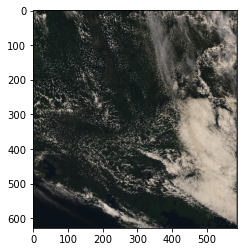

In [4]:
plt.imshow(RGB)
#https://github.com/digitalearthafrica/deafrica-sandbox-notebooks/blob/main/Real_world_examples/Machine_learning_with_ODC.ipynb
# https://github.com/ceos-seo/data_cube_utilities/blob/master/data_cube_utilities/dc_rgb.py

# ICON PLOT RADIANCES

<xarray.Dataset>
Dimensions:          (Longitude: 589, Latitude: 628, Channel: 36)
Coordinates:
  * Longitude        (Longitude) float32 4.5 4.517 4.534 ... 14.46 14.48 14.5
  * Latitude         (Latitude) float32 47.6 47.61 47.62 ... 54.47 54.49 54.5
  * Channel          (Channel) float32 1.0 2.0 3.0 4.0 ... 33.0 34.0 35.0 36.0
Data variables:
    BRF_total        (Channel, Latitude, Longitude) float32 ...
    BRF_clear        (Channel, Latitude, Longitude) float32 ...
    BT_total         (Channel, Latitude, Longitude) float32 ...
    BT_clear         (Channel, Latitude, Longitude) float32 ...
    Radiance_total   (Channel, Latitude, Longitude) float32 ...
    Radiance_clear   (Channel, Latitude, Longitude) float32 ...
    Radiance_cloudy  (Channel, Latitude, Longitude) float32 ...
    BRDF             (Channel, Latitude, Longitude) float32 ...
    Emissivity       (Channel, Latitude, Longitude) float32 ...
    iwp_ret          (Latitude, Longitude) float32 ...
    iwp_model        (

/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python3.9/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


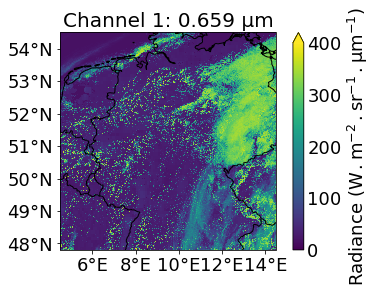

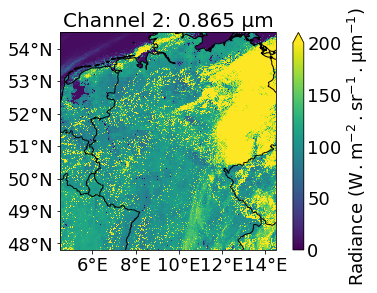

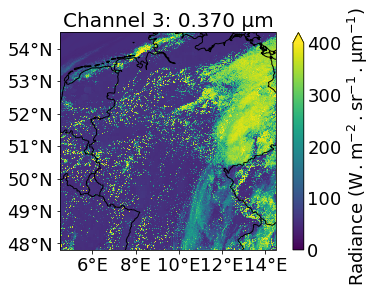

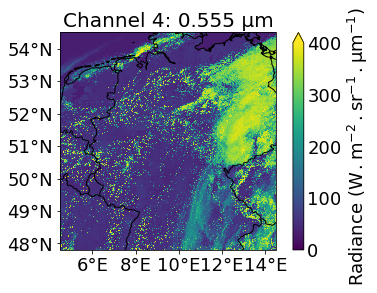

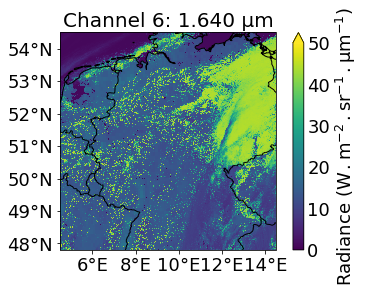

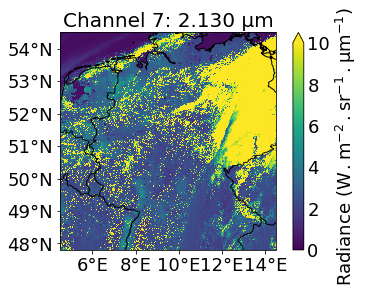

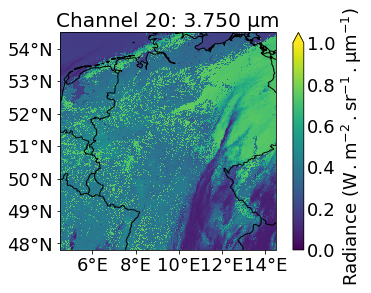

In [10]:
# from netCDF4 import Dataset
import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker
import matplotlib.pyplot as plt
import metpy
import numpy as np
import xarray

#################################################################################################################################
# Open the netCDF file
# --------------------

FILE = ('/work/bb1036/rttov_share/rttov-131-36-channels-05022013-07182022.nc')
nc = xarray.open_dataset(FILE)

print(nc)

# Read the variables
# ------------------
# lon = nc.variables['Longitude'][:]           # longitude (degrees_east)
# lat = nc.variables['Latitude'][:]           # latitude (degrees_north)
radiance = nc.variables['Radiance_total'][:,:,:]

# Close the netCDF file
# ---------------------
nc.close()

#################################################################################################################################
# Get radiances of interest
# -------------------------

# Band 1 = 0.659 µm (VIS, red)
radiance_1 = radiance[0,:,:]

# Band 2 = 0.865 µm (VIS)
radiance_2 = radiance[1,:,:]

# Band 3 = 0.470 µm (VIS, blue)
radiance_3 = radiance[2,:,:]

# Band 4 = 0.555 µm (VIS, green)
radiance_4 = radiance[3,:,:]

# Band 6 = 1.640 µm (NIR)
radiance_5 = radiance[5,:,:]

# Band 7 = 2.130 µm (NIR)
radiance_6 = radiance[6,:,:]

# Band 20 = 3.750 µm (NIR)
radiance_7 = radiance[19,:,:]

#################################################################################################################################
# Plot with cartopy mercator projection
# -------------------------------------

# data = nc.metpy.parse_cf('BRF_total')
data = nc.metpy.parse_cf()

icon = data['BRF_total'].metpy.cartopy_crs

x = data.Longitude
y = data.Latitude

proj = ccrs.PlateCarree()

offset = 0.0

min_lon = 4.5
max_lon = 14.5
min_lat = 47.8
max_lat = 54.5

ease_extent = [min_lon-offset, max_lon+offset, min_lat-offset, max_lat+offset]
               
#ax.set_extent([4.5, 14.5, 47.8, 54.5], crs=ccrs.PlateCarree())
swe_extent = [x.min(), x.max(), y.min(), y.max()]

#ax.imshow(RGB, origin='lower', extent=(x.min(), x.max(), y.min(), y.max()), transform=icon, interpolation='nearest', aspect='1.5') # 'none'

plt.figure()
ax1 = plt.axes(projection=proj)
ax1.set_extent(ease_extent, crs=proj)
im1 = ax1.imshow(radiance_1, vmin=0., vmax=400., cmap='viridis', extent=swe_extent, transform=proj, origin='lower', interpolation='none', aspect='1.5')
ax1.add_feature(ccrs.cartopy.feature.BORDERS, color='black', linewidth=1)
ax1.add_feature(ccrs.cartopy.feature.COASTLINE, color='black', linewidth=1)
ax1.set_title('Channel 1: 0.659 µm', fontsize=20)
ax1.set_xticks([6., 8., 10., 12., 14.], crs=ccrs.PlateCarree())
ax1.set_yticks([48., 49., 50., 51., 52., 53., 54.], crs=ccrs.PlateCarree())
ax1.set_xticklabels([6., 8., 10., 12., 14.], color='black', fontsize=18)
ax1.set_yticklabels([48., 49., 50., 51., 52., 53., 54.], color='black', fontsize=18)
lon_formatter = cticker.LongitudeFormatter()
lat_formatter = cticker.LatitudeFormatter()
ax1.xaxis.set_major_formatter(lon_formatter)
ax1.yaxis.set_major_formatter(lat_formatter)
cbar = plt.colorbar(im1, location='right', orientation='vertical', extend='max')
cbar.ax.tick_params(size=0, labelsize=18)
cbar.set_label(r'Radiance $(\mathrm{W\,.m^{-2}\,.sr^{-1}\,.µm^{-1}})$', size=18)
title1 = 'Simulated_MODIS_aqua_band_1_radiances_05022013_1140utc_irs_2022.png'
# plt.savefig(title1, format='png', dpi=1200)

plt.figure()
ax2 = plt.axes(projection=proj)
ax2.set_extent(ease_extent, crs=proj)
im2 = ax2.imshow(radiance_2, vmin=0., vmax=200., cmap='viridis', extent=swe_extent, transform=proj, origin='lower', interpolation='none', aspect='1.5')
ax2.add_feature(ccrs.cartopy.feature.BORDERS, color='black', linewidth=1)
ax2.add_feature(ccrs.cartopy.feature.COASTLINE, color='black', linewidth=1)
ax2.set_title('Channel 2: 0.865 µm', fontsize=20)
ax2.set_xticks([6., 8., 10., 12., 14.], crs=ccrs.PlateCarree())
ax2.set_yticks([48., 49., 50., 51., 52., 53., 54.], crs=ccrs.PlateCarree())
ax2.set_xticklabels([6., 8., 10., 12., 14.], color='black', fontsize=18)
ax2.set_yticklabels([48., 49., 50., 51., 52., 53., 54.], color='black', fontsize=18)
lon_formatter = cticker.LongitudeFormatter()
lat_formatter = cticker.LatitudeFormatter()
ax2.xaxis.set_major_formatter(lon_formatter)
ax2.yaxis.set_major_formatter(lat_formatter)
cbar = plt.colorbar(im2, location='right', orientation='vertical', extend='max')
cbar.ax.tick_params(size=0, labelsize=18)
cbar.set_label(r'Radiance $(\mathrm{W\,.m^{-2}\,.sr^{-1}\,.µm^{-1}})$', size=18)
title2 = 'Simulated_MODIS_aqua_band_2_radiances_05022013_1340pm_irs_2022.png'
# plt.savefig(title2, format='png', dpi=1200)

plt.figure()
ax3 = plt.axes(projection=proj)
ax3.set_extent(ease_extent, crs=proj)
im3 = ax3.imshow(radiance_3, vmin=0., vmax=400., cmap='viridis', extent=swe_extent, transform=proj, origin='lower', interpolation='none', aspect='1.5')
ax3.add_feature(ccrs.cartopy.feature.BORDERS, color='black', linewidth=1)
ax3.add_feature(ccrs.cartopy.feature.COASTLINE, color='black', linewidth=1)
ax3.set_title('Channel 3: 0.370 µm', fontsize=20)
ax3.set_xticks([6., 8., 10., 12., 14.], crs=ccrs.PlateCarree())
ax3.set_yticks([48., 49., 50., 51., 52., 53., 54.], crs=ccrs.PlateCarree())
ax3.set_xticklabels([6., 8., 10., 12., 14.], color='black', fontsize=18)
ax3.set_yticklabels([48., 49., 50., 51., 52., 53., 54.], color='black', fontsize=18)
lon_formatter = cticker.LongitudeFormatter()
lat_formatter = cticker.LatitudeFormatter()
ax3.xaxis.set_major_formatter(lon_formatter)
ax3.yaxis.set_major_formatter(lat_formatter)
cbar = plt.colorbar(im3, location='right', orientation='vertical', extend='max')
cbar.ax.tick_params(size=0, labelsize=18)
cbar.set_label(r'Radiance $(\mathrm{W\,.m^{-2}\,.sr^{-1}\,.µm^{-1}})$', size=18)
title3 = 'Simulated_MODIS_aqua_band_3_radiances_05022013_1340pm_irs_2022.png'
# plt.savefig(title3, format='png', dpi=1200)

plt.figure()
ax4 = plt.axes(projection=proj)
ax4.set_extent(ease_extent, crs=proj)
im4 = ax4.imshow(radiance_4, vmin=0., vmax=400., cmap='viridis', extent=swe_extent, transform=proj, origin='lower', interpolation='none', aspect='1.5')
ax4.add_feature(ccrs.cartopy.feature.BORDERS, color='black', linewidth=1)
ax4.add_feature(ccrs.cartopy.feature.COASTLINE, color='black', linewidth=1)
ax4.set_title('Channel 4: 0.555 µm', fontsize=20)
ax4.set_xticks([6., 8., 10., 12., 14.], crs=ccrs.PlateCarree())
ax4.set_yticks([48., 49., 50., 51., 52., 53., 54.], crs=ccrs.PlateCarree())
ax4.set_xticklabels([6., 8., 10., 12., 14.], color='black', fontsize=18)
ax4.set_yticklabels([48., 49., 50., 51., 52., 53., 54.], color='black', fontsize=18)
lon_formatter = cticker.LongitudeFormatter()
lat_formatter = cticker.LatitudeFormatter()
ax4.xaxis.set_major_formatter(lon_formatter)
ax4.yaxis.set_major_formatter(lat_formatter)
cbar = plt.colorbar(im4, location='right', orientation='vertical', extend='max')
cbar.ax.tick_params(size=0, labelsize=18)
cbar.set_label(r'Radiance $(\mathrm{W\,.m^{-2}\,.sr^{-1}\,.µm^{-1}})$', size=18)
title4 = 'Simulated_MODIS_aqua_band_4_radiances_05022013_1340pm_irs_2022.png'
# plt.savefig(title4, format='png', dpi=1200)

plt.figure()
ax5 = plt.axes(projection=proj)
ax5.set_extent(ease_extent, crs=proj)
im5 = ax5.imshow(radiance_5, vmin=0., vmax=50., cmap='viridis', extent=swe_extent, transform=proj, origin='lower', interpolation='none', aspect='1.5')
ax5.add_feature(ccrs.cartopy.feature.BORDERS, color='black', linewidth=1)
ax5.add_feature(ccrs.cartopy.feature.COASTLINE, color='black', linewidth=1)
ax5.set_title('Channel 6: 1.640 µm', fontsize=20)
ax5.set_xticks([6., 8., 10., 12., 14.], crs=ccrs.PlateCarree())
ax5.set_yticks([48., 49., 50., 51., 52., 53., 54.], crs=ccrs.PlateCarree())
ax5.set_xticklabels([6., 8., 10., 12., 14.], color='black', fontsize=18)
ax5.set_yticklabels([48., 49., 50., 51., 52., 53., 54.], color='black', fontsize=18)
lon_formatter = cticker.LongitudeFormatter()
lat_formatter = cticker.LatitudeFormatter()
ax5.xaxis.set_major_formatter(lon_formatter)
ax5.yaxis.set_major_formatter(lat_formatter)
cbar = plt.colorbar(im5, location='right', orientation='vertical', extend='max')
cbar.ax.tick_params(size=0, labelsize=18)
cbar.set_label(r'Radiance $(\mathrm{W\,.m^{-2}\,.sr^{-1}\,.µm^{-1}})$', size=18)
title5 = 'Simulated_MODIS_aqua_band_6_radiances_05022013_1340pm_irs_2022.png'
# plt.savefig(title5, format='png', dpi=1200)

plt.figure()
ax6 = plt.axes(projection=proj)
ax6.set_extent(ease_extent, crs=proj)
im6 = ax6.imshow(radiance_6, vmin=0., vmax=10., cmap='viridis', extent=swe_extent, transform=proj, origin='lower', interpolation='none', aspect='1.5')
ax6.add_feature(ccrs.cartopy.feature.BORDERS, color='black', linewidth=1)
ax6.add_feature(ccrs.cartopy.feature.COASTLINE, color='black', linewidth=1)
ax6.set_title('Channel 7: 2.130 µm', fontsize=20)
ax6.set_xticks([6., 8., 10., 12., 14.], crs=ccrs.PlateCarree())
ax6.set_yticks([48., 49., 50., 51., 52., 53., 54.], crs=ccrs.PlateCarree())
ax6.set_xticklabels([6., 8., 10., 12., 14.], color='black', fontsize=18)
ax6.set_yticklabels([48., 49., 50., 51., 52., 53., 54.], color='black', fontsize=18)
lon_formatter = cticker.LongitudeFormatter()
lat_formatter = cticker.LatitudeFormatter()
ax6.xaxis.set_major_formatter(lon_formatter)
ax6.yaxis.set_major_formatter(lat_formatter)
cbar = plt.colorbar(im6, location='right', orientation='vertical', extend='max')
cbar.ax.tick_params(size=0, labelsize=18)
cbar.set_label(r'Radiance $(\mathrm{W\,.m^{-2}\,.sr^{-1}\,.µm^{-1}})$', size=18)
title6 = 'Simulated_MODIS_aqua_band_7_radiances_05022013_1340pm_irs_2022.png'
# plt.savefig(title6, format='png', dpi=600)

plt.figure()
ax7 = plt.axes(projection=proj)
ax7.set_extent(ease_extent, crs=proj)
im7 = ax7.imshow(radiance_7, vmin=0., vmax=1., cmap='viridis', extent=swe_extent, transform=proj, origin='lower', interpolation='none', aspect='1.5')
ax7.add_feature(ccrs.cartopy.feature.BORDERS, color='black', linewidth=1)
ax7.add_feature(ccrs.cartopy.feature.COASTLINE, color='black', linewidth=1)
ax7.set_title('Channel 20: 3.750 µm', fontsize=20)
ax7.set_xticks([6., 8., 10., 12., 14.], crs=ccrs.PlateCarree())
ax7.set_yticks([48., 49., 50., 51., 52., 53., 54.], crs=ccrs.PlateCarree())
ax7.set_xticklabels([6., 8., 10., 12., 14.], color='black', fontsize=18)
ax7.set_yticklabels([48., 49., 50., 51., 52., 53., 54.], color='black', fontsize=18)
lon_formatter = cticker.LongitudeFormatter()
lat_formatter = cticker.LatitudeFormatter()
ax7.xaxis.set_major_formatter(lon_formatter)
ax7.yaxis.set_major_formatter(lat_formatter)
cbar = plt.colorbar(im7, location='right', orientation='vertical', extend='max')
cbar.ax.tick_params(size=0, labelsize=18)
cbar.set_label(r'Radiance $(\mathrm{W\,.m^{-2}\,.sr^{-1}\,.µm^{-1}})$', size=18)
title7 = 'Simulated_MODIS_aqua_band_20_radiances_05022013_1340pm_irs_2022.png'
# plt.savefig(title7, format='png', dpi=600)

plt.show()

In [35]:
#https://docs.xarray.dev/en/latest/user-guide/plotting.html
#https://xarray.pydata.org/en/v0.10.1/auto_gallery/plot_cartopy_facetgrid.html
import xarray as xr
import numpy as np
import argparse
import pprint

import cartopy.crs as ccrs
# import cartopy.mpl.ticker as cticker

# from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import matplotlib as mpl
# from matplotlib.colors import LinearSegmentedColormap
import numpy as np
# from matplotlib.ticker import MaxNLocator

def plot_MODIS_simulation(variable, band, lat, lon, title_subplot, map_limit, swe_extent, fig, ax, min_colorbar, max_colorbar, type_variable):

        proj = ccrs.PlateCarree()

    #axes = axes.ravel()
        if (type_variable == "refl_emis" and (band >= 1 and band <= 20 or band == 26)):
            cbar_label = 'none'
        else:
            cbar_label = 'Radiance $(W\,m^{-2}\,sr^{-1}\,\mu m^{-1})$'

        print(' ================= ploting band {} ================= '.format(band))



        # map = Basemap(projection='merc',llcrnrlon=map_limit[2],llcrnrlat=map_limit[0],urcrnrlon=map_limit[3],urcrnrlat=map_limit[1],resolution='f',ax=ax) #Germany
        # map.drawcoastlines()
        # map.drawcountries()
        # map.drawstates()
        # map.drawparallels(np.arange(-90.,91.,1.),labels=[1,0,0,1],fontsize=10)
        # map.drawmeridians(np.arange(-180.,181.,2.),labels=[1,0,0,1],fontsize=10)

        data = variable#(chan, lat, lon) #check it when it is nan or inf np.ma.masked_where((ds_array[variable][col]< 2000), ds_array[variable][col])                

        # if(title_subplot == "RTTOV (12:30/2/5/2013)-Channel:"):
#             lon,lat = np.meshgrid(lon,lat) ###funcionara sin esto revisar !!!!!!!!!!!!!!1
#             print(" ================= RTTOV data min and max: ", np.min(data),np.max(data))

#         x,y = map(lon,lat)  

        #pprint.pprint(data)

        #_FillValue= 999999# 0 #65535  #decide if it is needed to pass as parameter
        
        if(title_subplot == "MODIS (11:40/2/5/2013)-Channel:"):
            data = np.ma.masked_equal(data, 0) # np.ma.masked_array(data,np.isnan(data)) # data== _FillValue) mmmno necesito creo
                
            print(" ================= MODIS data min and max: ", np.min(data),np.max(data))

        #pprint.pprint(data)

        #extend = 'both' #min,max,both,neither
        # cmap=plt.get_cmap('jet') #du bleu au rouge
                        
        #cs = map.contourf(x,y, y_filtered,levels,extend=extend,cmap=cmap) 

        print(' ================= PLOT colobar min and max', min_colorbar, max_colorbar)
#         cs = map.pcolormesh(x,y,data, cmap=cmap,shading='auto', vmin = min_colorbar, vmax = max_colorbar)
    
#         cbar = fig.colorbar(cs, ax=ax,label=cbar_label,shrink=0.75) #location="right",pad="5%",ticks=[270,275,280,285,290,295,300],
#         cbar.ax.tick_params(size=0,labelsize=10)

#         ax.set_title("{}{}".format(title_subplot, band),fontsize=14)
#         ax.set_xlabel('Longitude', labelpad=20,fontsize=14)
#         ax.set_ylabel('Latitude', labelpad=33,fontsize=14)

        # ax = plt.axes(projection=proj)
        # ax.set_extent(ease_extent, crs=proj)
        im1 = ax.imshow(data, vmin=min_colorbar, vmax=max_colorbar, cmap='viridis', extent=swe_extent, transform=proj, origin='lower', interpolation='none', aspect='1.5')
        ax.add_feature(ccrs.cartopy.feature.BORDERS, color='black', linewidth=1)
        ax.add_feature(ccrs.cartopy.feature.COASTLINE, color='black', linewidth=1)
        ax.set_title("{}{}".format(title_subplot, band),fontsize=14)
        lon_formatter = cticker.LongitudeFormatter()
        lat_formatter = cticker.LatitudeFormatter()
        ax.xaxis.set_major_formatter(lon_formatter)
        ax.yaxis.set_major_formatter(lat_formatter)
        cbar = fig.colorbar(im1, ax=ax,label=cbar_label,shrink=0.75)
        ax.set_xlabel('Longitude', labelpad=20,fontsize=14)
        ax.set_ylabel('Latitude', labelpad=33,fontsize= 14)


In [37]:
# FILE = ('/work/bb1036/rttov_share/rttov-131-36-channels-05022013-07182022.nc')
path_dataset="/work/bb1036/b381362/dataset" 
path_out="/home/b/b381362/output"   
path_output = "/home/b/b381362/output/output_OPAC"

rttov_path = path_out+ "/output-rttov/rttov-131-36-channels-05022013-07182022.nc"

MODIS_path = path_dataset +"/MODIS_Germany_refl_emis_MYD021KM.A2013122.1140.061.2018046032403.nc"
type_variable = "refl_emis"

# ease_extent=np.zeros(4)
min_lat = 47.5 #llcrnrlat
max_lat= 54.5 # 496 #urcrnrlatMODIS_variable
min_lon = 4.5 #llcrnrlon
max_lon = 14.5 #496 #urcrnrlon

ease_extent = [min_lon, max_lon, min_lat, max_lat]

rttov_ds = xr.open_dataset(rttov_path).compute()


MODIS_ds = xr.open_dataset(MODIS_path).compute()


rttov_variable = np.zeros((np.shape(rttov_ds['BRF_total'].values)))

MODIS_variable = np.zeros((3, np.shape(MODIS_ds['lat'].values)[0], np.shape(MODIS_ds['lat'].values)[1]))


if (type_variable == "refl_emis"):
    MODIS_variable = MODIS_ds['MODIS_Germany_refl_emis']
#         rttov_variable =rttov_ds['bt_refl_total'][:3]
    rttov_variable[:19] = rttov_ds['BRF_total'][:19] #refl 1-19, 26 rad 20-25 and 27-36
    rttov_variable[19:25] = rttov_ds['Radiance_total'][19:25]
    rttov_variable[25] = rttov_ds['BRF_total'][25] #solo tengo en este archivo 1-19,26 luego tengo q hacer todo esto en un solo file
    rttov_variable[26:36] = rttov_ds['Radiance_total'][26:36]
    print("getting_refl_emis")

elif (type_variable == "radiance"):
    MODIS_variable =MODIS_ds['MODIS_Germany_radiances']  
    rttov_variable =rttov_ds['Radiance_total'] #'y' neceisto cambiar el nombre de esta variable



MODIS_bands =MODIS_ds['bands'].values
rttov_bands = list(range(1, 37)) #np.arrayrttov_ds_rad['channel'].values  ##check it becasue i am using 2 files


MODIS_lat = MODIS_ds['lat'].values
MODIS_lon = MODIS_ds['lon'].values

rttov_lat = rttov_ds['Latitude'].values
rttov_lon = rttov_ds['Longitude'].values

swe_extent = [rttov_lon.min(), rttov_lon.max(), rttov_lat.min(), rttov_lat.max()]

    
n_imgs = len(MODIS_bands)*2 #np.size(bands)
print(n_imgs)
#ncols = 2 #
nrows = 2 #
#print(n_imgs)

#nrows = n_imgs // ncols + (n_imgs % ncols > 0) #tbn pujede ser entrada
ncols = n_imgs // nrows + (n_imgs % nrows > 0) #tbn pujede ser entrada

fig = plt.figure(figsize=(5*ncols, 5*nrows),facecolor = 'white')   
fig.subplots_adjust(wspace=0.1, hspace=0.2)

position =list(range(1,n_imgs+1)) #[1:76]
position_rttov = position[:n_imgs//2 +1] #position[::2]
position_MODIS = position[n_imgs//2:] #[1::2]


for i in range(len(MODIS_bands)): 
#for i in range(2):
    bnd=MODIS_bands[i].astype(int) # hacer que cuando sea igual al indice seleccionar ese cuando la dim chan ==i
    variable = np.ma.masked_array(MODIS_variable[i],  np.isnan(MODIS_variable[i])) ## check it!!!!!!!!

    position =position_MODIS[i]

    print(bnd, position)

    variable_simulation = np.ma.masked_array(rttov_variable[bnd-1], np.isnan(rttov_variable[bnd-1])) 

    # variable_simulation = np.ma.masked_equal(variable_simulation, 0) # np.ma.masked_array(data,np.isnan(data)) # data== _FillValue)
#check it   why it is needed to doit creo q no??

    min_colorbar = np.min([np.min(variable), np.min(variable_simulation)])
    max_colorbar = np.max([np.max(variable), np.max(variable_simulation)])
    print('============modis colobar min and max',np.min(variable[i]), np.max(variable[i]))
    print('============rttov colobar min and max', np.min(variable_simulation[bnd-1]), np.max(variable_simulation[bnd-1]))

    print('============code colobar min and max', min_colorbar, max_colorbar)



    title_subplot= "MODIS (11:40/2/5/2013)-Channel:"
    ax = plt.subplot(nrows, ncols, position)
    ax = plt.axes(projection=proj)
        
    plot_MODIS_simulation(variable = variable, #in the below area there are missing data i cut it, 
                          band = MODIS_bands[i],   
                          lat = MODIS_lat, 
                          lon = MODIS_lon, 
                          title_subplot = title_subplot, 
                          map_limit = ease_extent, 
                          swe_extent = swe_extent,
                          fig = fig, 
                          ax = ax, 
                          max_colorbar = max_colorbar, 
                          min_colorbar = min_colorbar,
                          type_variable = type_variable)

    title_subplot= "RTTOV (12:30/2/5/2013)-Channel:"
    position = position_rttov[i] #position+38 
    print(position)

    print(rttov_bands[bnd-1], position)

    ax = plt.subplot(nrows, ncols, position)
    plot_MODIS_simulation(variable = variable_simulation, #in the below area there are missing data i cut it, 
                          band = rttov_bands[bnd-1], 
                          lat = rttov_lat, 
                          lon = rttov_lon, 
                          title_subplot = title_subplot, 
                          map_limit = ease_extent, 
                          swe_extent = swe_extent,
                          fig = fig, 
                          ax = ax, 
                          max_colorbar = max_colorbar, 
                          min_colorbar = min_colorbar,
                          type_variable = type_variable)


plt.tight_layout()
figure_name = '{}/MODIS and RTTOV output {} in all bands_OPAC.png'.format(path_output, type_variable) #aca pasarr con todo path

fig.savefig(figure_name) 
plt.close()    


getting_refl_emis
76
1 39
============modis colobar min and max 0.0 0.5687876480806153
============rttov colobar min and max 0.038460616022348404 0.10086556524038315
============code colobar min and max 0.0 0.9643381834030151
 ================= ploting band 1.0 ================= 
 ================= MODIS data min and max:  0.025645337816968095 0.8853129848721437
 ================= PLOT colobar min and max 0.0 0.9643381834030151
1
1 1
 ================= ploting band 1 ================= 
 ================= PLOT colobar min and max 0.0 0.9643381834030151


AttributeError: 'AxesSubplot' object has no attribute 'add_feature'

ValueError: Axes should be an instance of GeoAxes, got <class 'matplotlib.axes._subplots.AxesSubplot'>

<Figure size 13680x720 with 3 Axes>

In [45]:
    import pandas as pd
    variable = MODIS_variable.values
    
    X_flated = variable.transpose(1,2,0).reshape(-1,variable.shape[0]) # 
    print(np.shape(X_flated))
    df=pd.DataFrame(X_flated) 
    for i in range(len(MODIS_bands)):
        count_nan = df[i].isnull().sum()
        print ('In band {} values NaN: {}'.format(MODIS_bands[i], count_nan))  

    pd.set_option('display.float_format', lambda x: '%.1f' % x)
    df.columns= MODIS_bands



(701701, 38)
In band 1.0 values NaN: 0
In band 2.0 values NaN: 4055
In band 3.0 values NaN: 0
In band 4.0 values NaN: 0
In band 5.0 values NaN: 0
In band 6.0 values NaN: 106993
In band 7.0 values NaN: 0
In band 8.0 values NaN: 84997
In band 9.0 values NaN: 176408
In band 10.0 values NaN: 204134
In band 11.0 values NaN: 215432
In band 12.0 values NaN: 227906
In band 13.0 values NaN: 247779
In band 13.5 values NaN: 277880
In band 14.0 values NaN: 246261
In band 14.5 values NaN: 282029
In band 15.0 values NaN: 268234
In band 16.0 values NaN: 268427
In band 17.0 values NaN: 10491
In band 18.0 values NaN: 0
In band 19.0 values NaN: 0
In band 26.0 values NaN: 0
In band 20.0 values NaN: 0
In band 21.0 values NaN: 0
In band 22.0 values NaN: 0
In band 23.0 values NaN: 0
In band 24.0 values NaN: 0
In band 25.0 values NaN: 0
In band 27.0 values NaN: 0
In band 28.0 values NaN: 0
In band 29.0 values NaN: 0
In band 30.0 values NaN: 0
In band 31.0 values NaN: 0
In band 32.0 values NaN: 0
In band 33.0

In [47]:
df.describe()#.to_csv(out_file + ".csv")

,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,...,27.0,28.0,29.0,30.0,31.0,32.0,33.0,34.0,35.0,36.0
count,701701.0,697646.0,701701.0,701701.0,701701.0,594708.0,701701.0,616704.0,525293.0,497567.0,...,701701.0,701701.0,701701.0,701701.0,701701.0,701701.0,701701.0,701701.0,701701.0,671171.0
mean,0.1,0.2,0.2,0.1,0.2,0.1,0.1,0.1,0.0,0.0,...,0.4,0.9,2.1,1.5,2.5,2.4,1.7,1.4,1.2,0.9
std,0.2,0.2,0.2,0.2,0.2,0.2,0.1,0.2,0.1,0.0,...,0.5,1.1,2.7,1.9,3.1,3.0,2.0,1.7,1.5,1.2
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,0.3,0.4,0.3,0.3,0.3,0.2,0.2,0.2,0.0,0.0,...,1.1,2.3,5.1,3.7,6.0,5.8,4.2,3.4,3.0,2.4
max,0.9,0.7,0.9,0.9,0.8,0.6,0.4,0.6,0.3,0.2,...,1.3,2.7,8.5,5.6,9.3,8.7,5.0,3.9,3.4,2.6


In [50]:
df.describe()#.to_csv(out_file + ".csv")

,1,2,3,4,5,6,7,8,9,10,...,27,28,29,30,31,32,33,34,35,36
count,369892.0,369892.0,369892.0,369892.0,369892.0,369892.0,369892.0,369892.0,369892.0,369892.0,...,369892.0,369892.0,369892.0,369892.0,369892.0,369892.0,369892.0,369892.0,369892.0,369892.0
mean,0.3,0.5,0.2,0.3,0.5,0.3,0.2,0.2,0.2,0.3,...,1.1,2.3,6.0,4.2,6.7,6.4,4.3,3.5,3.0,2.3
std,0.3,0.2,0.2,0.2,0.2,0.2,0.2,0.2,0.2,0.2,...,0.2,0.4,1.5,0.8,1.5,1.3,0.6,0.3,0.2,0.1
min,0.0,0.0,0.1,0.1,0.0,0.0,0.0,0.1,0.1,0.1,...,0.4,0.6,1.0,1.4,1.6,1.8,1.9,1.9,1.9,1.9
25%,0.1,0.4,0.1,0.1,0.4,0.2,0.1,0.1,0.1,0.1,...,1.1,2.2,5.2,3.8,6.0,5.8,4.2,3.5,3.0,2.3
50%,0.1,0.4,0.1,0.1,0.4,0.2,0.1,0.1,0.1,0.1,...,1.2,2.5,6.2,4.3,6.9,6.6,4.5,3.6,3.1,2.3
75%,0.4,0.6,0.4,0.4,0.6,0.4,0.3,0.3,0.4,0.4,...,1.3,2.6,7.2,4.8,8.0,7.5,4.7,3.7,3.1,2.3
max,1.0,1.0,0.9,0.9,0.9,0.7,0.5,0.8,0.8,0.9,...,1.4,2.9,8.7,5.6,9.3,8.6,5.0,3.8,3.2,2.4


In [49]:


    variable = rttov_variable
    
    X_flated = variable.transpose(1,2,0).reshape(-1,variable.shape[0]) # 
    print(np.shape(X_flated))
    df=pd.DataFrame(X_flated) 
    for i in range(len(rttov_bands)):
        count_nan = df[i].isnull().sum()
        print ('In band {} values NaN: {}'.format(rttov_bands[i], count_nan))  

    pd.set_option('display.float_format', lambda x: '%.1f' % x)
    df.columns= rttov_bands
    

(369892, 36)
In band 1 values NaN: 0
In band 2 values NaN: 0
In band 3 values NaN: 0
In band 4 values NaN: 0
In band 5 values NaN: 0
In band 6 values NaN: 0
In band 7 values NaN: 0
In band 8 values NaN: 0
In band 9 values NaN: 0
In band 10 values NaN: 0
In band 11 values NaN: 0
In band 12 values NaN: 0
In band 13 values NaN: 0
In band 14 values NaN: 0
In band 15 values NaN: 0
In band 16 values NaN: 0
In band 17 values NaN: 0
In band 18 values NaN: 0
In band 19 values NaN: 0
In band 20 values NaN: 0
In band 21 values NaN: 0
In band 22 values NaN: 0
In band 23 values NaN: 0
In band 24 values NaN: 0
In band 25 values NaN: 0
In band 26 values NaN: 0
In band 27 values NaN: 0
In band 28 values NaN: 0
In band 29 values NaN: 0
In band 30 values NaN: 0
In band 31 values NaN: 0
In band 32 values NaN: 0
In band 33 values NaN: 0
In band 34 values NaN: 0
In band 35 values NaN: 0
In band 36 values NaN: 0


## data PCA

In [59]:
import numpy as np
import sklearn.datasets, sklearn.decomposition

X = sklearn.datasets.load_iris().data
mu = np.mean(X, axis=0)

pca = sklearn.decomposition.PCA()
pca.fit(X)

nComp = 2
Xhat = np.dot(pca.transform(X)[:,:nComp], pca.components_[:nComp,:])
Xhat += mu

print(Xhat[0,])

[5.08303897 3.51741393 1.40321372 0.21353169]
